## Flight Delay Prediction 
### Machine Learning At Scale
***Team 22 - Chenlin Ye, Hongsuk Nam and Swati Akella***

####[Link for End To End pipeline](https://dbc-9bfca75b-725c.cloud.databricks.com/?o=52497824689954#notebook/887545360132133/command/887545360132538)

### Introduction

Growth in the aviation industry has resulted in air-traffic congestion causing flight delays. According to the Bureau of Transportation Statistics, there are different reasons for flight delays including air carrier delay, National Aviation System (NAS) delay, and weather delay. Since NAS and weather delays are outside of a carrier’s control and weather is one of the main parts of the NAS delay, it would be beneficial to predict flight delays based on the weather conditions. 

Flight delays impact not only the airlines directly and their customers, but also have a direct influence on the economy. These delays can damage the airlines’ reputation, resulting in loss of demand by passengers. Moreover, it may indirectly affect the efficiency of the air transportation system which requires more number of employees, which increases the cost of doing business. 

Based on the SOTA literature, currently their precision is around 0.88 with GBT, 5 busiest airports, AA only, 2 years data. Right now our dataset is much larger than the reference, which has US entire airports/airlines with 5 years data (2015-2019) but we will have SOTA literature as a reference for now.


### Business Question
**How can an airline improve customer satisfaction by predicting flight delay 2 hours prior to take-off?**

**Evaluation Metrics: **
With the dataset along with the weather data from that period, we would like to predict flight delay prior to 2 hours so that we can manage the above business problems better. And since it would be the most important to minimize to tell the customer that their flight will be late, but actually it isn’t (the customer will miss their flight), we will focus on minimizing the false positive along with precision is the rate of false positive out of total delay prediction. We will also be evaluating based on area under precision and recall curve.


***Citations***

https://www.transtats.bts.gov/OT_Delay/ot_delaycause1.asp?display=chart&pn=1

https://www.airlines.org/data/annual-u-s-impact-of-flight-delays-nextor-report/

https://arxiv.org/pdf/1903.06740.pdf

### Data Sources And Documentation

##### Airline Data:
Subset of the passenger flight's on-time performance data taken from the TranStats data collection available from the U.S. Department of Transportation (DOT)
1. https://www.transtats.bts.gov/DL_SelectFields.asp?Table_ID=236   
2. https://www.bts.gov/topics/airlines-and-airports/understanding-reporting-causes-flight-delays-and-cancellations

##### Weather Data:
Weather data spanning 2015-2019 has been downloaded from the National Oceanic and Atmospheric Administration repository  

1. https://www.ncei.noaa.gov/data/global-hourly/doc/isd-format-document.pdf


##### Airports Geographical Location:
1. http://dss.ucar.edu/datasets/ds353.4/inventories/station-list.html
2. https://www.world-airport-codes.com/

### Import packages

In [6]:
from pyspark.sql import functions as f
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType, NullType, ShortType, DateType, BooleanType, BinaryType
from pyspark.sql import SQLContext
import pyspark.ml.feature as ftr
import pyspark.ml as ml
from pyspark.ml.regression import DecisionTreeRegressor
from pyspark.sql.window import Window

import numpy as np
import seaborn as sns
import re
import time
import sklearn.metrics as metrics
import matplotlib.pyplot as plt

sqlContext = SQLContext(sc)

/databricks/spark/python/pyspark/sql/context.py:77: DeprecationWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
 DeprecationWarning)

### Data Extraction

##### Data directory & team folder setup and review

In [9]:
# Data directory
DATA_PATH = "dbfs:/mnt/mids-w261/data/datasets_final_project/"
display(dbutils.fs.ls(DATA_PATH))

path,name,size
dbfs:/mnt/mids-w261/data/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/allstate-claims-severity.zip,allstate-claims-severity.zip,51204863
dbfs:/mnt/mids-w261/data/datasets_final_project/dac.tar.gz,dac.tar.gz,4576820670
dbfs:/mnt/mids-w261/data/datasets_final_project/kdd-cup-2014-predicting-excitement-at-donors-choose.zip,kdd-cup-2014-predicting-excitement-at-donors-choose.zip,971133938
dbfs:/mnt/mids-w261/data/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/porto-seguro-safe-driver-prediction.zip,porto-seguro-safe-driver-prediction.zip,80247571
dbfs:/mnt/mids-w261/data/datasets_final_project/walmart-recruiting-trip-type-classification.zip,walmart-recruiting-trip-type-classification.zip,11510035
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/,weather_data/,0


In [10]:
# Weather data 
display(dbutils.fs.ls(DATA_PATH+"weather_data"))

path,name,size
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather-miss.parquet/,weather-miss.parquet/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather2015a.parquet/,weather2015a.parquet/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather2016a.parquet/,weather2016a.parquet/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather2017a.parquet/,weather2017a.parquet/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather2018a.parquet/,weather2018a.parquet/,0
dbfs:/mnt/mids-w261/data/datasets_final_project/weather_data/weather2019a.parquet/,weather2019a.parquet/,0


In [11]:
# create the team folder and setting up the team path
# dbutils.fs.mkdirs('dbfs:/mnt/w261/team22')
TEAM_PATH = 'dbfs:/mnt/w261/team22/'
display(dbutils.fs.ls('dbfs:/mnt/w261/'))

path,name,size
dbfs:/mnt/w261/team22/,team22/,0


In [12]:
# Display contents of team folder
display(dbutils.fs.ls('dbfs:/mnt/w261/team22'))

path,name,size
dbfs:/mnt/w261/team22/airlines_6m_cleaned.parquet/,airlines_6m_cleaned.parquet/,0
dbfs:/mnt/w261/team22/airlines_cleaned.parquet/,airlines_cleaned.parquet/,0
dbfs:/mnt/w261/team22/airlines_final.parquet/,airlines_final.parquet/,0
dbfs:/mnt/w261/team22/airlines_wairport.parquet/,airlines_wairport.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather.parquet/,airlines_weather.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather_inner_join.parquet/,airlines_weather_inner_join.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather_leftjoin.parquet/,airlines_weather_leftjoin.parquet/,0
dbfs:/mnt/w261/team22/airport_cleaned.parquet/,airport_cleaned.parquet/,0
dbfs:/mnt/w261/team22/model/,model/,0
dbfs:/mnt/w261/team22/model_cy/,model_cy/,0


In [13]:
# Create folders to save models

#dbutils.fs.mkdirs('dbfs:/mnt/w261/team22/model')
#dbutils.fs.mkdirs('dbfs:/mnt/w261/team22/model/lr')
#dbutils.fs.mkdirs('dbfs:/mnt/w261/team22/model/dt')
#dbutils.fs.mkdirs('dbfs:/mnt/w261/team22/model/gbt')
MODEL_LR = 'dbfs:/mnt/w261/team22/model/lr'
MODEL_DT = 'dbfs:/mnt/w261/team22/model/dt'
MODEL_GBT = 'dbfs:/mnt/w261/team22/model/gbt'
display(dbutils.fs.ls('dbfs:/mnt/w261/team22'))

path,name,size
dbfs:/mnt/w261/team22/airlines_6m_cleaned.parquet/,airlines_6m_cleaned.parquet/,0
dbfs:/mnt/w261/team22/airlines_cleaned.parquet/,airlines_cleaned.parquet/,0
dbfs:/mnt/w261/team22/airlines_final.parquet/,airlines_final.parquet/,0
dbfs:/mnt/w261/team22/airlines_wairport.parquet/,airlines_wairport.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather.parquet/,airlines_weather.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather_inner_join.parquet/,airlines_weather_inner_join.parquet/,0
dbfs:/mnt/w261/team22/airlines_weather_leftjoin.parquet/,airlines_weather_leftjoin.parquet/,0
dbfs:/mnt/w261/team22/airport_cleaned.parquet/,airport_cleaned.parquet/,0
dbfs:/mnt/w261/team22/model/,model/,0
dbfs:/mnt/w261/team22/model_cy/,model_cy/,0


##### Loading Airline data

In [15]:
# Airline data
airlines = spark.read.option("header", "true").parquet(DATA_PATH+"parquet_airlines_data/*.parquet")

# Check the number of records loaded
f'{airlines.count():,}'

Out[14]: '31,746,841'

In [16]:
display(airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2019,4,10,6,7,2019-10-06,9E,20363,9E,N8783E,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,645,637,-8.0,0.0,0.0,-1,0600-0659,45.0,722,759,6.0,806,805,-1.0,0.0,0.0,-1,0800-0859,0.0,null,0.0,81.0,88.0,37.0,1.0,175.0,1,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,4,10,7,1,2019-10-07,9E,20363,9E,N801AY,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,645,633,-12.0,0.0,0.0,-1,0600-0659,8.0,641,720,4.0,806,724,-42.0,0.0,0.0,-2,0800-0859,0.0,null,0.0,81.0,51.0,39.0,1.0,175.0,1,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,4,10,8,2,2019-10-08,9E,20363,9E,N8847A,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,645,635,-10.0,0.0,0.0,-1,0600-0659,14.0,649,726,4.0,806,730,-36.0,0.0,0.0,-2,0800-0859,0.0,null,0.0,81.0,55.0,37.0,1.0,175.0,1,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,4,10,9,3,2019-10-09,9E,20363,9E,N8683B,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,645,637,-8.0,0.0,0.0,-1,0600-0659,29.0,706,751,4.0,806,755,-11.0,0.0,0.0,-1,0800-0859,0.0,null,0.0,81.0,78.0,45.0,1.0,175.0,1,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,4,10,10,4,2019-10-10,9E,20363,9E,N801AY,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,645,632,-13.0,0.0,0.

##### Weather data

In [18]:
# Weather data
weather = spark.read.option("header", "true").parquet(DATA_PATH+"weather_data/*.parquet")

# # Check the number of records loaded
f'{weather.count():,}'

Out[16]: '630,904,436'

In [19]:
display(weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
6760099999,2017-01-01T00:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"015,1,N,0001,1","99999,9,9,9","999999,9,9,9","+0022,1","-0055,1","10295,1",,,,,,,,,,"99999,9,09831,1","8,1,014,1,+999,9",,,,"4,06,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"06,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T01:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"999,9,C,0000,1","99999,9,9,N","999999,9,9,9","+0029,1","-0058,1","10287,1",,,,,,,,,,"99999,9,09825,1","7,1,017,1,+999,9",,,,"3,99,0010,1,999","5,99,0005,1,999",SYN08206760 23/// /0000 10029 21058 39825 40287 57017 333 55300 20000 60005 91102 91201=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T02:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"313,1,N,0002,1","99999,9,9,9","999999,9,9,9","+0027,1","-0061,1","10283,1",,,,,,,,,,"99999,9,09821,1","6,1,016,1,+999,9",,,,"4,01,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T03:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"324,1,N,0003,1","99999,9,9,9","999999,9,9,9","+0021,1","-0061,1","10278,1",,,,,,,,,,"99999,9,09815,1","7,1,016,1,+999,9",,,,"4,03,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T04:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"044,1,N,0007,1","99999,9,9,9","999999,9,9,9","+0020,1","-0064,1","10274,1",,,,,,,,,,"99999,9,09811,1","6,1,014,1,+999,9",,,,"4,01,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T05:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"342,1,N,0001,1","99999,9,9,9","999999,9,9,9","+0022,1","-0068,1","10269,1",,,,,,,,,,"99999,9,09807,1","6,1,014,1,+999,9",,,,"4,01,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T06:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",FM-12,99999,V020,"046,1,N,0004,1","22000,1,9,9","040000,1,9,9","+0022,1","-0070,1","10269,1",,,,,,,"00,99,1,99,9,99,9,99999,9,99,9,99,9","120,N,+0016,1",,"99999,9,09806,1","7,1,009,1,+999,9",,,,"4,06,9999,9,999",,SYN004BUFR,,,,,,,,,,,,,,,,,,,"0,1,99,9",,,,,,,,,,,,,"24,9999,9,9",,,,,,,,,,,,,,"01,9999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"12,9999,9,9",,,,,,,,,,,,,,,"00,9",,,,,,,,"0,1,99,9",,,,,,"999,-0035,9",,,,,,,,,,,,,,,,,,,
6760099999,2017-01-01T07:00:00.000+0000,4,46.1666666,8.7833333,380.0,"LOCARNO MONTI, SZ",

##### Airport data
- Uploaded 193498910_T_MASTER_CORD.csv to Databricks HDFS
- Read file to notebook and inferred schema

In [21]:
def airport_extract(a=None):

  file_location = "/FileStore/tables/193498910_T_MASTER_CORD.csv"
  file_type = "csv"

  infer_schema = "true"
  first_row_is_header = "true"
  delimiter = ","

  airport = spark.read.format(file_type).option("inferSchema", infer_schema).option("header", first_row_is_header).option("sep", delimiter).load(file_location)
  return airport

airport = airport_extract(None)
display(airport)

AIRPORT_SEQ_ID,AIRPORT_ID,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,AIRPORT_WAC,AIRPORT_COUNTRY_CODE_ISO,AIRPORT_STATE_CODE,LATITUDE,LONGITUDE
1000101,10001,01A,Afognak Lake Airport,"Afognak Lake, AK",1,US,AK,58.10944444,-152.9066667
1000301,10003,03A,Bear Creek Mining Strip,"Granite Mountain, AK",1,US,AK,65.54805556,-161.0716667
1000401,10004,04A,Lik Mining Camp,"Lik, AK",1,US,AK,68.08333333,-163.1666667
1000501,10005,05A,Little Squaw Airport,"Little Squaw, AK",1,US,AK,67.57,-148.1838889
1000601,10006,06A,Kizhuyak Bay,"Kizhuyak, AK",1,US,AK,57.74527778,-152.8827778
1000701,10007,07A,Klawock Seaplane Base,"Klawock, AK",1,US,AK,55.55472222,-133.1016667
1000801,10008,08A,Elizabeth Island Airport,"Elizabeth Island, AK",1,US,AK,59.15694444,-151.8291667
1000901,10009,09A,Augustin Island,"Homer, AK",1,US,AK,59.36277778,-153.4305556
1001001,10010,1B1,Columbia County,"Hudson, NY",22,US,NY,42.28888889,-73.71027778
1001002,10010,1B1,Columbia County,"Hudson, NY",22,US,NY,42.29138889,-73.71027778


### Data Transformation

**Data Preprocessing**

Airline Data consisted of 31,746,841 rows and 109 columns spanning 5 years. Weather data contained 630,904,436 rows and 177 columns covering several countries. Prior to the EDA process, the data was preprocessed to extract relevant information to ensure insights were gained only from data related to US aviation and weather conditions.

After a reviewing the data documentation for both airlines and weather, and reading through supplemental documentation, column selection for further exportaion was performed.
<https://www.faa.gov/regulations_policies/handbooks_manuals/aviation/phak/media/14_phak_ch12.pdf>

From the dataset the below columns were selected.
- Airlines:
  - Timeframe: Year, Quarter Month, Day of Month, Day of Week, FL_Date, Scheduled time of delay and arrival
  - Airline: OP_Unique Carrier, Tail Number
  - Airport: Origin, Destination
  - Outcome Variable - DEP_DEL15
  
- Weather:
  - Day and time information
  - Latitude and Longitude
  - Weather Measures: Wind speed, cloud cover, visual distance, dew temperature, sea level pressure, snow, ground surface weather conditions

**Implementation:**

In order to extract the necessary features efficiently, the below steps were followed:

**1) Reducing the size of the dataset:**
  - Accomplished by filtering out non US data and non-airport weather stations in weather dataset
  - Retaining weather records under report type FM-15 (weather observation for aviation)
  - Limiting the size of the data by dropping columns as soon as the desired features was extracted

**2) Reducing the processing time:**
  - Combining transformations into a single command using "OR" and "AND operators"
  - Not stacking up too many transformations before running an action

**3) Saving transformed data to parquet files**
  - This helped with not spending time rerunning the transformations before moving on to the next step

##### Transforming airport Data

Filter down to US airports only

In [26]:
# filter down to US airport only 
# remove duplicates (original dataset uses polygon to represent some airports; one point each airport is sufficient for us)
def airport_transform(dataframe):
  return (
    dataframe
    .filter("AIRPORT_COUNTRY_CODE_ISO = 'US'")
    .dropDuplicates(['AIRPORT'])
    )

In [27]:
airport = airport_transform(airport)
display(airport)

AIRPORT_SEQ_ID,AIRPORT_ID,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,AIRPORT_WAC,AIRPORT_COUNTRY_CODE_ISO,AIRPORT_STATE_CODE,LATITUDE,LONGITUDE
1003601,10036,A23,Bradley Lake Airport,"Bradley Lake, AK",1,US,AK,59.77611111,-151.9636111
1057701,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20138889,-75.96916667
1085301,10853,BZT,Eagle Air Park,"Brazoria, TX",74,US,TX,28.98222222,-95.57972222
1114301,11143,CRS,C David Campbell Field-Corsicana Municipal,"Corsicana, TX",74,US,TX,32.0275,-96.39805556
1171401,11714,FMY,Page Field,"Fort Myers, FL",33,US,FL,26.58694444,-81.86222222
1043701,10437,AVX,Catalina,"Avalon, CA",91,US,CA,33.405,-118.4158333
1133601,11336,DLG,Dillingham Airport,"Dillingham, AK",1,US,AK,59.04166667,-158.5066667
1153501,11535,ELI,Elim Airport,"Elim, AK",1,US,AK,64.61361111,-162.2702778
1069701,10697,BNF,Warm Spring Bay Seaplane Base,"Baranof, AK",1,US,AK,57.08916667,-134.8313889
1006001,10060,A47,Distin Lake Airport,"Distin Lake, AK",1,US,AK,57.61666667,-134.3666667


Keep airports that co-exist in the airline dataset

In [29]:
# Creating sql view for airlines and airports
def airport_selection(a=None):
  global airlines
  global airport
  
  airlines.createOrReplaceTempView('airlines')
  airport.createOrReplaceTempView('airport')

  airport = spark.sql(
    """
    SELECT * 
    FROM
      airport 
    WHERE 
      AIRPORT IN (
        SELECT DISTINCT ORIGIN FROM airlines
        UNION
        SELECT DISTINCT DEST FROM airlines
        )
    """
  )
  return airport

airport = airport_selection(None)
display(airport)

AIRPORT_SEQ_ID,AIRPORT_ID,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,AIRPORT_WAC,AIRPORT_COUNTRY_CODE_ISO,AIRPORT_STATE_CODE,LATITUDE,LONGITUDE
1057701,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20138889,-75.96916667
1057702,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20861111,-75.97972222
1057703,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20833333,-75.97972222
1057704,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20861111,-75.97972222
1057705,10577,BGM,Greater Binghamton/Edwin A. Link Field,"Binghamton, NY",22,US,NY,42.20833333,-75.97972222
1133601,11336,DLG,Dillingham Airport,"Dillingham, AK",1,US,AK,59.04166667,-158.5066667
1133602,11336,DLG,Dillingham Airport,"Dillingham, AK",1,US,AK,59.04472222,-158.5055556
1234301,12343,INL,Falls International,"International Falls, MN",63,US,MN,48.56305556,-93.40416667
1234302,12343,INL,Falls International,"International Falls, MN",63,US,MN,48.56555556,-93.40222222
1234303,12343,INL,Falls International Einarson Field,"International Falls, MN",63,US,MN,48.56555556,-93.40222222


##### Check point - Transformed airport data
- This airport data contains airports that co-exist in the airlines dataset

In [31]:
# COMMENTED OUT TO AVOID OVERWRITING THE PARQUET FILE

# write to parquet
# dbutils.fs.rm(TEAM_PATH + "airport_cleaned.parquet", recurse=True)
# airport.write.parquet(TEAM_PATH + "airport_cleaned.parquet")

In [32]:
# Read from parquet
airport = spark.read.option("header", "true").parquet(TEAM_PATH+"airport_cleaned.parquet")
airport.createOrReplaceTempView('airport')
f'{airport.count():,}'

Out[376]: '372'

##### Transforming airline Data
After reviewing the below references, the below columns from the airlines dataset were determinted to impact flight delay.

<https://www.transtats.bts.gov/DL_SelectFields.asp?Table_ID=236>

In [34]:
# Airlines transformation function

# Drop cancelled and diverted flights
# cast FL_DATE to date type
# cast OP_CARRIER_FL_NUM to string type
# create new column DEP_TIME_HOUR from DEP_TIME_BLK
# create new column ARR_TIME_HOUR from ARR_TIME_BLK
# extract scheduled departure hour CRS_DEP_TIME_HOUR from CRS_DEP_TIME
# extract scheduled arrival hour CRS_ARR_TIME_HOUR from CRS_ARR_TIME
# cast DISTANCE_GROUP to string type
# Create new column by concatenating OP_CARRIER and OP_CARRIER_FL_NUMBER
# cast DEP_DEL15 to string type



def airlines_transform(dataframe):
  
  # Selected Columns
  selected_col = [
  "YEAR",
  "QUARTER",
  "MONTH",
  "DAY_OF_MONTH",
  "DAY_OF_WEEK",
  "FL_DATE",
  "OP_UNIQUE_CARRIER",
  "TAIL_NUM",
  "OP_CARRIER_FL_NUM",
  "ORIGIN",
  "ORIGIN_CITY_NAME",
  "ORIGIN_STATE_ABR",
  "DEST",
  "DEST_CITY_NAME",
  "DEST_STATE_ABR",
  "CRS_DEP_TIME",
  "CRS_DEP_TIME_HOUR",
  "DEP_TIME_HOUR",
  "DEP_DELAY_NEW",
  "DISTANCE",
  "DISTANCE_GROUP",
  "DEP_DEL15",
  "ORIGIN_AIRPORT_ID",
  "DEST_AIRPORT_ID",
  "CRS_DEP_TIMESTAMP",
  "CRS_ARR_TIMESTAMP",
  "PR_ARR_DEL15"]
  
  # Creating a window partition to extract prior arrival delay for each flight
  windowSpec = Window.partitionBy("TAIL_NUM").orderBy("CRS_DEP_TIMESTAMP")
  
  # Returning the transformed dataset
  return (
    dataframe
    .filter("CANCELLED != 1 AND DIVERTED != 1")
    .withColumn("FL_DATE", f.col("FL_DATE").cast("date"))
    .withColumn("OP_CARRIER_FL_NUM", f.col("OP_CARRIER_FL_NUM").cast("string"))
    .withColumn("DEP_TIME_HOUR", dataframe.DEP_TIME_BLK.substr(1, 2).cast("int"))
    .withColumn("ARR_TIME_HOUR", dataframe.ARR_TIME_BLK.substr(1, 2).cast("int"))
    .withColumn("CRS_DEP_TIME_HOUR", f.round((f.col("CRS_DEP_TIME")/100)).cast("int"))
    .withColumn("CRS_ARR_TIME_HOUR", f.round((f.col("CRS_ARR_TIME")/100)).cast("int"))
    .withColumn("DISTANCE_GROUP", f.col("DISTANCE_GROUP").cast("string"))
    .withColumn("OP_CARRIER_FL_NUM", f.concat(f.col("OP_CARRIER"),f.lit("_"),f.col("OP_CARRIER_FL_NUM")))
    .withColumn("DEP_DEL15", f.col("DEP_DEL15").cast("string"))
    .withColumn("ARR_DEL15", f.col("ARR_DEL15").cast("string"))
    .withColumn("FL_DATE_string", f.col("FL_DATE").cast("string"))
    .withColumn("YEAR", f.col("YEAR").cast("string"))
    .withColumn("QUARTER", f.col("QUARTER").cast("string"))
    .withColumn("MONTH", f.col("MONTH").cast("string"))
    .withColumn("DAY_OF_MONTH", f.col("DAY_OF_MONTH").cast("string"))
    .withColumn("DAY_OF_WEEK", f.col("DAY_OF_WEEK").cast("string"))
    .withColumn("CRS_DEP_TIME_string", f.col("CRS_DEP_TIME").cast("string"))
    .withColumn("CRS_ARR_TIME_string", f.col("CRS_ARR_TIME").cast("string"))
    .withColumn("CRS_DEP_TIME_HOUR_string", f.col("CRS_DEP_TIME_HOUR").cast("string"))
    .withColumn("CRS_ARR_TIME_HOUR_string", f.col("CRS_ARR_TIME_HOUR").cast("string"))
    .withColumn("CRS_DEP_TIME_HH", f.lpad("CRS_DEP_TIME_string", 4, '0').substr(1,2))
    .withColumn("CRS_DEP_TIME_MM", f.lpad("CRS_DEP_TIME_string", 4, '0').substr(3,2))
    .withColumn("CRS_ARR_TIME_HH", f.lpad("CRS_ARR_TIME_string", 4, '0').substr(1,2))
    .withColumn("CRS_ARR_TIME_MM", f.lpad("CRS_ARR_TIME_string", 4, '0').substr(3,2))
    # Timestamp created to calculate prior arrival delay of a flight and to join with weather dataset
    .withColumn("CRS_DEP_TIMESTAMP", f.concat(f.col("FL_DATE_string"),f.lit(" "),f.col("CRS_DEP_TIME_HH"), f.lit(":"),f.col("CRS_DEP_TIME_MM")).cast("timestamp"))
    .withColumn("CRS_ARR_TIMESTAMP", f.concat(f.col("FL_DATE_string"),f.lit(" "),f.col("CRS_ARR_TIME_HH"), f.lit(":"),f.col("CRS_ARR_TIME_MM")).cast("timestamp"))
    .withColumn("CRS_ELAPSED_TIME", f.round((f.col("CRS_ELAPSED_TIME")/60)).cast("int"))
    # Variable created to incorportate effects of a prior arrival delay into the current flight's departure delay
    .withColumn("PR_ARR_DEL15", f.lag(f.col("ARR_DEL15"), 1).over(windowSpec).cast("string"))
    .select(selected_col)
    )

In [35]:
# Transforming airlines
airlines = airlines_transform(airlines)

##### Check point - transformed airlines data

In [37]:
# write to parquet
#dbutils.fs.rm(TEAM_PATH + "airlines_cleaned.parquet", recurse=True)
#airlines.write.parquet(TEAM_PATH + "airlines_cleaned.parquet")

In [38]:
# Read from parquet
airlines = spark.read.option("header", "true").parquet(TEAM_PATH+"airlines_cleaned.parquet")
airlines.createOrReplaceTempView('airlines')
f'{airlines.count():,}'

Out[390]: '31,178,801'

In [39]:
display(airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIMESTAMP,CRS_ARR_TIMESTAMP,PR_ARR_DEL15
2018,1,1,1,1,2018-01-01,G4,218NV,G4_890,PIE,"St. Petersburg, FL",FL,FWA,"Fort Wayne, IN",IN,700,7,7,0.0,0700-0759,925,9,9,0.0,0900-0959,912.0,4,0.0,0.0,14112,11823,2018-01-01T07:00:00.000+0000,2018-01-01T09:25:00.000+0000,null
2018,1,1,1,1,2018-01-01,G4,218NV,G4_891,FWA,"Fort Wayne, IN",IN,PIE,"St. Petersburg, FL",FL,1010,10,10,330.0,1000-1059,1233,12,12,333.0,1200-1259,912.0,4,1.0,1.0,11823,14112,2018-01-01T10:10:00.000+0000,2018-01-01T12:33:00.000+0000,0.0
2018,1,1,2,2,2018-01-02,G4,218NV,G4_1402,PIT,"Pittsburgh, PA",PA,JAX,"Jacksonville, FL",FL,815,8,8,95.0,0800-0859,1022,10,10,103.0,1000-1059,694.0,3,1.0,1.0,14122,12451,2018-01-02T08:15:00.000+0000,2018-01-02T10:22:00.000+0000,1.0
2018,1,1,2,2,2018-01-02,G4,218NV,G4_1406,JAX,"Jacksonville, FL",FL,CLE,"Cleveland, OH",OH,1102,11,11,133.0,1100-1159,1316,13,13,117.0,1300-1359,753.0,4,1.0,1.0,12451,11042,2018-01-02T11:02:00.000+0000,2018-01-02T13:16:00.000+0000,1.0
2018,1,1,2,2,2018-01-02,G4,218NV,G4_1407,CLE,"Cleveland, OH",OH,JAX,"Jacksonville, FL",FL,1401,14,14,122.0,1400-1459,1610,16,16,126.0,1600-1659,753.0,4,1.0,1.0,11042,12451,2018-01-02T14:01:00.000+0000,2018-01-02T16:10:00.000+0000,1.0
2018,1,1,2,2,2018-01-02,G4,218NV,G4_1403,JAX,"Jacksonville, FL",FL,PIT,"Pittsburgh, PA",PA,1650,17,16,158.0,1600-1659,1845,18,18,152.0,1800-1859,694.0,3,1.0,1.0,12451,14122,2018-01-02T16:50:00.000+0000,2018-01-02T18:45:00.000+0000,1.0
2018,1,1,3,3,2018-01-03,G4,218NV,G4_854,PIE,"St. Petersburg, FL",FL,SBN,"South Bend, IN",IN,741,7,7,48.0,0700-0759,1017,10,10,36.0,1000-1059,973.0,4,1.0,1.0,14112,14696,2018-01-03T07:41:00.000+0000,2018-01-03T10:17:00.000+0000,1.0
2018,1,1,3,3,2018-01-03,G4,218NV,G4_855,SBN,"South Bend, IN",IN,PIE,"St. Petersburg, FL",FL,1107,11,11,96.0,1100-1159,1343,13,13,109.0,1300-1359,973.0,4,1.0,1.0,14696,14112,2018-01-03T11:07:00.000+0000,2018-01-03T13:43:00.000+0000,1.0
2018,1,1,3,3,2018-01-03,G4,218NV,G4_890,PIE,"St. Petersburg, FL",FL,FWA,"Fort Wayne, IN",IN,1712,17,17,4.0,1700-1759,1939,19,19,1.0,1900-1959,912.0,4,0.0,0.0,14112,11823,2018-01-03T17:12:00.000+0000,2018-01-03T19:39:00.000+0000,1.0
2018,1,1,3,3,2018-01-03,G4,218NV,G4_891,FWA,"Fort Wayne, IN",IN,PIE,"St. Petersburg, FL",FL,2024,20,20,72.0,2000-2059,2248,22,22,66.0,2200-2259,912.0,4,1.0,1.0,11823,14112,2018-01-03T20:24:00.000+0000,2018-01-03T22:48:00.000+0000,0.0


In [40]:
airlines.count()

Out[391]: 31178801

##### Transforming Weather Data
The weather dataset contains columns and rows that do not pertain to aviation. We narrowed down the dataset using five transformation steps.

##### Transforming weather data - part 1
- Filter weather dataset to US and Report Type "FM-15"

In [43]:
# Filter out US only
# Keep weather records for FM15 report type

def weather_transformation_reduction(dataframe, shorlisted_weather_cols):
  return (
    dataframe
      .withColumn("COUNTRY", f.substring(f.col("NAME"), -2, 2))
      .filter("COUNTRY = 'US'")
      .filter("REPORT_TYPE LIKE '%FM-15%'")
      .select(shorlisted_weather_cols)
  )

shorlisted_weather_cols = ["STATION", "DATE", "LATITUDE", 'LONGITUDE', 'NAME', 'REPORT_TYPE', 'CALL_SIGN', 'WND', 'CIG', 'VIS', 'TMP', 'DEW', 'SLP', 'AA1', 'AJ1', 'AT1', 'GA1', 'IA1', 'MA1']

# Writing to Parquet
# dbutils.fs.rm(TEAM_PATH + "weather_us.parquet", recurse=True)
# weather_transformation_reduction(weather, shorlisted_weather_cols).write.parquet(TEAM_PATH + "weather_us.parquet")

In [44]:
# Checking for weather.parquet
display(dbutils.fs.ls('dbfs:/mnt/w261/team22'))

path,name,size
dbfs:/mnt/w261/team22/airlines_6m_cleaned.parquet/,airlines_6m_cleaned.parquet/,0
dbfs:/mnt/w261/team22/airport_cleaned.parquet/,airport_cleaned.parquet/,0
dbfs:/mnt/w261/team22/test/,test/,0
dbfs:/mnt/w261/team22/testweather_transformed.parquet/,testweather_transformed.parquet/,0
dbfs:/mnt/w261/team22/weather.parquet/,weather.parquet/,0
dbfs:/mnt/w261/team22/weather_stations.parquet/,weather_stations.parquet/,0
dbfs:/mnt/w261/team22/weather_us.parquet/,weather_us.parquet/,0


In [45]:
weather = spark.read.option("header", "true").parquet(TEAM_PATH+"weather_us.parquet")
weather.createOrReplaceTempView('weather')

##### Transforming weather data - part 2
- Keep station records that co-exist in the airport dataset

In [47]:
airport = spark.read.option("header", "true").parquet(TEAM_PATH+"airport_cleaned.parquet")
# create sql view
airport.createOrReplaceTempView('airport')

Weather station to airport spatial join - so each airport can have a closest weather station id attached

In [49]:
## COMMENTING THIS CELL SO WE DO NOT REPLACE THE DATASET
# weather stations table with coordinates

weather_coordinates = spark.sql(
"""
SELECT 
  DISTINCT STATION, CALL_SIGN, LATITUDE, LONGITUDE
FROM 
  weather
"""
)

#dbutils.fs.rm(TEAM_PATH + "weather_stations.parquet", recurse=True)
#weather_coordinates.write.parquet(TEAM_PATH + "weather_stations.parquet")

In [50]:
weather_coordinates = spark.read.option("header", "true").parquet(TEAM_PATH + "weather_stations.parquet")
weather_coordinates_pdf = weather_coordinates.toPandas()

In [51]:
airport_pdf = airport.toPandas()
airport_pdf

,AIRPORT_SEQ_ID,AIRPORT_ID,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,AIRPORT_WAC,AIRPORT_COUNTRY_CODE_ISO,AIRPORT_STATE_CODE,LATITUDE,LONGITUDE
0,1069301,10693,BNA,Nashville International,"Nashville, TN",54,US,TN,36.126667,-86.681944
1,1096701,10967,CGI,Cape Girardeau Regional,"Cape Girardeau, MO",64,US,MO,37.223611,-89.571667
2,1104901,11049,CLL,Easterwood Field,"College Station/Bryan, TX",74,US,TX,30.589444,-96.364444
3,1105701,11057,CLT,Douglas Municipal,"Charlotte, NC",36,US,NC,35.219167,-80.935833
4,1400401,14004,PAE,Snohomish County Paine Field,"Everett, WA",93,US,WA,47.908333,-122.281389
...,...,...,...,...,...,...,...,...,...,...
367,1040801,10408,ATW,Outagamie County Regional,"Appleton, WI",45,US,WI,44.257778,-88.520000
368,1130801,11308,DHN,Dothan Regional,"Dothan, AL",51,US,AL,31.320000,-85.448333
369,1387101,13871,OMA,Eppley Airfield,"Omaha, NE",65,US,NE,41.301944,-95.893333
370,1198601,11986,GRR,Kent County,"Grand Rapids, MI",43,US,MI,42.881111,-85.524167


In [52]:
# Eclidean Distance calculation
X_coordinates = airport_pdf[['LATITUDE', 'LONGITUDE']]
Y_coordinates = weather_coordinates_pdf[['LATITUDE', 'LONGITUDE']]

weather_station_idx = metrics.pairwise_distances_argmin_min(X_coordinates, Y_coordinates, metric='euclidean')[0]
weather_station_idx

Out[397]: array([ 98, 474, 438, 101, 453, 531, 685, 90, 55, 301, 401, 234, 318,
 393, 27, 259, 11, 1, 84, 240, 174, 707, 133, 89, 583, 176,
 7, 17, 716, 43, 189, 37, 173, 526, 107, 482, 616, 31, 21,
 38, 199, 171, 461, 682, 534, 313, 13, 95, 613, 306, 167, 106,
 512, 571, 516, 160, 420, 432, 3, 137, 361, 35, 326, 110, 36,
 138, 178, 298, 168, 104, 44, 34, 288, 149, 577, 12, 241, 132,
 153, 28, 61, 317, 498, 25, 57, 574, 515, 77, 322, 56, 24,
 547, 532, 387, 144, 273, 282, 339, 75, 506, 20, 151, 177, 36,
 170, 271, 291, 79, 83, 105, 266, 42, 346, 14, 71, 321, 33,
 182, 280, 377, 68, 360, 146, 59, 618, 264, 162, 499, 487, 412,
 224, 67, 70, 307, 45, 122, 386, 65, 101, 82, 2, 108, 184,
 207, 23, 164, 230, 150, 145, 126, 336, 228, 203, 131, 443, 312,
 325, 58, 510, 134, 109, 32, 270, 423, 269, 183, 86, 148, 455,
 202, 29, 163, 648, 97, 684, 135, 208, 456, 281, 536, 158, 514,
 141, 383, 26, 370, 66, 410, 390, 72, 285, 332, 0, 73, 290,
 316, 620, 417, 251, 112, 367, 87, 311, 660, 139, 268, 411, 505,
 352, 70, 16, 402, 197, 50, 147, 253, 283, 220, 408, 19, 111,
 74, 119, 52, 428, 140, 289, 743, 366, 222, 219, 279, 63, 579,
 231, 624, 323, 247, 319, 232, 92, 621, 483, 116, 129, 562, 371,
 560, 449, 542, 444, 166, 18, 274, 165, 206, 123, 431, 254, 254,
 120, 124, 520, 102, 198, 263, 200, 110, 41, 243, 368, 4, 594,
 295, 333, 188, 634, 665, 356, 80, 395, 205, 78, 62, 382, 421,
 85, 69, 15, 496, 5, 94, 9, 47, 118, 277, 384, 51, 8,
 115, 389, 580, 127, 392, 260, 397, 30, 364, 338, 257, 96, 294,
 470, 238, 21, 49, 413, 181, 22, 355, 128, 372, 209, 381, 405,
 157, 396, 477, 255, 324, 235, 10, 693, 503, 48, 156, 211, 358,
 687, 547, 215, 494, 597, 458, 33, 76, 373, 318, 567, 214, 236,
 398, 218, 335, 310, 154, 6, 237, 265, 692, 522, 459, 93, 195,
 226, 40, 91, 39, 419, 186, 578, 300])

In [53]:
station_id = [weather_coordinates_pdf.iloc[i]['STATION'] for i in weather_station_idx]
station_id_weather_filter = spark.createDataFrame(station_id,StringType())
station_id_weather_filter.createOrReplaceTempView('station_id_weather_filter')

##### Check point - weather data with stations co-exist in the airport dataset

In [55]:
#dbutils.fs.rm(TEAM_PATH + "weather_us_stations.parquet", recurse=True)
weather = weather.where(f.col("STATION").isin(set(station_id)))
# Write to parquet
#weather.write.parquet(TEAM_PATH + "weather_us_stations.parquet")
# Create SQL View
weather.createOrReplaceTempView('weather')

In [56]:
weather = spark.read.option("header", "true").parquet(TEAM_PATH+"weather_us_stations.parquet")
weather.createOrReplaceTempView('weather')

In [57]:
display(weather)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,CALL_SIGN,WND,CIG,VIS,TMP,DEW,SLP,AA1,AJ1,AT1,GA1,IA1,MA1
72691724284,2017-01-01T00:15:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"040,1,N,0026,1","00945,1,9,N","016093,1,9,9","+0080,1","+0020,1","99999,9",,,,,,"10190,1,99999,9"
72691724284,2017-01-01T00:35:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"999,9,C,0000,1","00945,1,9,N","016093,1,9,9","+0070,1","+0020,1","99999,9",,,,,,"10190,1,99999,9"
72691724284,2017-01-01T00:55:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"310,1,N,0015,1","00884,1,9,N","016093,1,9,9","+0070,1","+0030,1","99999,9",,,,,,"10190,1,99999,9"
72691724284,2017-01-01T01:15:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"320,1,N,0015,1","00823,1,9,N","016093,1,9,9","+0070,1","+0020,1","99999,9",,,,,,"10186,1,99999,9"
72691724284,2017-01-01T01:35:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"320,1,N,0015,1","00884,1,9,N","016093,1,9,9","+0070,1","+0030,1","99999,9",,,,,,"10183,1,99999,9"
72691724284,2017-01-01T01:55:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"999,9,C,0000,1","00823,1,9,N","016093,1,9,9","+0070,1","+0030,1","99999,9",,,,,,"10186,1,99999,9"
72691724284,2017-01-01T02:15:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"999,9,C,0000,1","00884,1,9,N","016093,1,9,9","+0070,1","+0030,1","99999,9",,,,,,"10186,1,99999,9"
72691724284,2017-01-01T02:35:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"999,9,C,0000,1","00762,1,9,N","016093,1,9,9","+0060,1","+0030,1","99999,9",,,,,,"10183,1,99999,9"
72691724284,2017-01-01T02:55:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"999,9,C,0000,1","00640,1,9,N","011265,1,9,9","+0060,1","+0040,1","99999,9",,,,,,"10186,1,99999,9"
72691724284,2017-01-01T03:15:00.000+0000,43.41333,-124.24361,"NORTH BEND SOUTHWEST OREGON REGIONAL AIRPORT, OR US",FM-15,99999,"140,1,N,0015,1","00518,1,9,N","004828,1,9,9","+0060,1","+0040,1","99999,9",,,,,,"10183,1,99999,9"


##### Transforming weather data - part 3
- Weather feature extraction and tarnsformation

1. First of all, by looking into each weather feature, we extract relevant features that would affect to the airline delay.
2. In the weather dataset, there are missing values that can't count as Null. In order to handle those values for imputation later, we filled those missing values with Null.
3. In weather data section, there are substrings delimited by ",", so we parsed out those substrings into new columns.
4. We assigned erroneous data which codes are 3 and 7 to "999" which indicates missing values.
5. We changed all missing values with Null which will be handled with imputation later.
6. Finally we dropped unnecessary columns for faster running.

In [59]:
def weather_transformation(dataframe):  
  return (
    dataframe
      # Mandatory data section - WND - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("WND_temp", f.substring_index("WND", ",", -2))\
      .withColumn("WND_SPEED", f.substring_index("WND_temp", ",", 1))\
      .withColumn("WND_SPEED_QUALITY", f.substring_index("WND_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("WND_SPEED_QUALITY", f.when((f.col("WND_SPEED_QUALITY") == "3") | (f.col("WND_SPEED_QUALITY") == "7") , "999").otherwise(f.col("WND_SPEED_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("WND_SPEED", f.when((f.col("WND_SPEED") == "") | (f.col("WND_SPEED") == "9999") | (f.col("WND_SPEED_QUALITY") == "999"), None).otherwise(f.col("WND_SPEED")))\
      # Drop unnecessary columns
      .drop("WND_temp","WND", "WND_SPEED_QUALITY")\
      # Mandatory data section - CIG - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("CIG_CAVOC", f.substring_index("CIG", ",", -1))\
      # Change the missing values to Null
      .withColumn("CIG_CAVOC", f.when((f.col("CIG_CAVOC") == "") | (f.col("CIG_CAVOC") == "9"), None).otherwise(f.col("CIG_CAVOC")))\
      # Drop unnecessary columns
      .drop("CIG")\
      # Mandatory data section - VIS - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("VIS_temp", f.substring_index("VIS", ",", 2))\
      .withColumn("VIS_DISTANCE", f.substring_index("VIS_temp", ",", 1))\
      .withColumn("VIS_DISTANCE_QUALITY", f.substring_index("VIS_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("VIS_DISTANCE_QUALITY", f.when((f.col("VIS_DISTANCE_QUALITY") == "3") | (f.col("VIS_DISTANCE_QUALITY") == "7"), "999").otherwise(f.col("VIS_DISTANCE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("VIS_DISTANCE", f.when((f.col("VIS_DISTANCE") == "") | (f.col("VIS_DISTANCE") == "999999") | (f.col("VIS_DISTANCE_QUALITY") == "999"), None).otherwise(f.col("VIS_DISTANCE")))\
      # Drop unnecessary columns
      .drop("VIS_temp", "VIS_DISTANCE_QUALITY", "VIS")\
      # Mandatory data section - TMP - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("TMP_TEMP", f.substring_index("TMP", ",", 1))\
      .withColumn("TMP_TEMP_QUALITY", f.substring_index("TMP", ",", -1))\
      # Filter out erroneous data
      .withColumn("TMP_TEMP_QUALITY", f.when((f.col("TMP_TEMP_QUALITY") == "3") | (f.col("TMP_TEMP_QUALITY") == "7"), "999").otherwise(f.col("TMP_TEMP_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("TMP_TEMP", f.when((f.col("TMP_TEMP") == "") | (f.col("TMP_TEMP") == "+9999") | (f.col("TMP_TEMP_QUALITY") == "999"), None).otherwise(f.col("TMP_TEMP")))\
      # Drop unnecessary columns
      .drop("TMP_TEMP_QUALITY", "TMP")\
      # Mandatory data section - DEW - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("DEW_TEMP", f.substring_index("DEW", ",", 1))\
      .withColumn("DEW_TEMP_QUALITY", f.substring_index("DEW", ",", -1))\
      # Filter out erroneous data
      .withColumn("DEW_TEMP_QUALITY", f.when((f.col("DEW_TEMP_QUALITY") == "3") | (f.col("DEW_TEMP_QUALITY") == "7"), "999").otherwise(f.col("DEW_TEMP_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("DEW_TEMP", f.when((f.col("DEW_TEMP") == "") | (f.col("DEW_TEMP") == "+9999") | (f.col("DEW_TEMP_QUALITY") == "999"), None).otherwise(f.col("DEW_TEMP")))\
      # Drop unnecessary columns
      .drop("DEW_TEMP_QUALITY", "DEW")\
      # Mandatory data section - SLP - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("SLP_PRESSURE", f.substring_index("SLP", ",", 1))\
      .withColumn("SLP_PRESSURE_QUALITY", f.substring_index("SLP", ",", -1))\
      # Filter out erroneous data
      .withColumn("SLP_PRESSURE_QUALITY", f.when((f.col("SLP_PRESSURE_QUALITY") == "3") | (f.col("SLP_PRESSURE_QUALITY") == "7"), "999").otherwise(f.col("SLP_PRESSURE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("SLP_PRESSURE", f.when((f.col("SLP_PRESSURE") == "") | (f.col("SLP_PRESSURE") == "99999") | (f.col("SLP_PRESSURE_QUALITY") == "999"), None).otherwise(f.col("SLP_PRESSURE")))\
      # Drop unnecessary columns
      .drop("SLP_PRESSURE_QUALITY", "SLP" )\
      # Additional data section - AA1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("AA1_temp", f.substring_index("AA1", ",", -3))\
      .withColumn("PRECIPITATION", f.substring_index("AA1_temp", ",", 1))\
      .withColumn("PRECIPITATION_QUALITY", f.substring_index("AA1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("PRECIPITATION_QUALITY", f.when((f.col("PRECIPITATION_QUALITY") == "3") | (f.col("PRECIPITATION_QUALITY") == "7"), "999").otherwise(f.col("PRECIPITATION_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("PRECIPITATION", f.when((f.col("PRECIPITATION") == "") | (f.col("PRECIPITATION") == "9999") | (f.col("PRECIPITATION_QUALITY") == "999"), None).otherwise(f.col("PRECIPITATION")))\
      # Drop unnecessary columns
      .drop("AA1_temp", "AA1", "PRECIPITATION_QUALITY")\
      # Additional data section - AJ1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("AJ1_temp", f.substring_index("AJ1", ",", 3))\
      .withColumn("SNOW", f.substring_index("AJ1_temp", ",", 1))\
      .withColumn("SNOW_QUALITY", f.substring_index("AJ1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("SNOW_QUALITY", f.when((f.col("SNOW_QUALITY") == "3") | (f.col("SNOW_QUALITY") == "7"), "999").otherwise(f.col("SNOW_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("SNOW", f.when((f.col("SNOW") == "") | (f.col("SNOW") == "9999") | (f.col("SNOW_QUALITY") == "999"), None).otherwise(f.col("SNOW")))\
      # Drop unnecessary columns
      .drop("AJ1_temp", "AJ1", "SNOW_QUALITY")\
      # Additional data section - AT1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("AT1_temp", f.substring_index("AT1", ",", -3))\
      .withColumn("WEATHER_OBSERVATION", f.substring_index("AT1_temp", ",", 1))\
      .withColumn("WEATHER_OBSERVATION_QUALITY", f.substring_index("AT1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("WEATHER_OBSERVATION_QUALITY", f.when((f.col("WEATHER_OBSERVATION_QUALITY") == "3") | (f.col("WEATHER_OBSERVATION_QUALITY") == "7"), "999").otherwise(f.col("WEATHER_OBSERVATION_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("WEATHER_OBSERVATION", f.when((f.col("WEATHER_OBSERVATION") == "") | (f.col("WEATHER_OBSERVATION_QUALITY") == "999"), None).otherwise(f.col("WEATHER_OBSERVATION")))\
      # Drop unnecessary columns
      .drop("AT1", "AT1_temp", "WEATHER_OBSERVATION_QUALITY")\
      # Additional data section - GA1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("GA1_temp", f.substring_index("GA1", ",", 4))\
      .withColumn("GA1_temp2", f.substring_index("GA1_temp", ",", 2))\
      .withColumn("GA1_temp3", f.substring_index("GA1_temp", ",", -2))\
      .withColumn("CLOUD_COVERAGE", f.substring_index("GA1_temp2", ",", 1))\
      .withColumn("CLOUD_COVERAGE_QUALITY", f.substring_index("GA1_temp2", ",", -1))\
      # Filter out erroneous data
      .withColumn("CLOUD_COVERAGE_QUALITY", f.when((f.col("CLOUD_COVERAGE_QUALITY") == "3") | (f.col("CLOUD_COVERAGE_QUALITY") == "7"), "999").otherwise(f.col("CLOUD_COVERAGE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("CLOUD_COVERAGE", f.when((f.col("CLOUD_COVERAGE") == "") | (f.col("CLOUD_COVERAGE") == "99") | (f.col("CLOUD_COVERAGE") == "9") | (f.col("CLOUD_COVERAGE") == "10") | (f.col("CLOUD_COVERAGE_QUALITY") == "999"), None).otherwise(f.col("CLOUD_COVERAGE")))\
      # Drop unnecessary columns
      .drop("GA1", "GA1_temp", "GA1_temp2", "CLOUD_COVERAGE_QUALITY")\
      # Additional data section - GA1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("CLOUD_BASE_HEIGHT", f.substring_index("GA1_temp3", ",", 1))\
      .withColumn("CLOUD_BASE_HEIGHT_QUALITY", f.substring_index("GA1_temp3", ",", -1))\
      # Filter out erroneous data
      .withColumn("CLOUD_BASE_HEIGHT_QUALITY", f.when((f.col("CLOUD_BASE_HEIGHT_QUALITY") == "3") | (f.col("CLOUD_BASE_HEIGHT_QUALITY") == "7"), "999").otherwise(f.col("CLOUD_BASE_HEIGHT_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("CLOUD_BASE_HEIGHT", f.when((f.col("CLOUD_BASE_HEIGHT") == "") | (f.col("CLOUD_BASE_HEIGHT") == "+99999") | (f.col("CLOUD_BASE_HEIGHT_QUALITY") == "999"), None).otherwise(f.col("CLOUD_BASE_HEIGHT")))\
      # Drop unnecessary columns
      .drop("GA1_temp3", "CLOUD_BASE_HEIGHT_QUALITY")\
      # Additional data section - IA1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("GROUND_SURFACE", f.substring_index("IA1", ",", 1))\
      .withColumn("GROUND_SURFACE_QUALITY", f.substring_index("IA1", ",", -1))\
      # Filter out erroneous data
      .withColumn("GROUND_SURFACE_QUALITY", f.when(f.col("GROUND_SURFACE_QUALITY") == "3", "999").otherwise(f.col("GROUND_SURFACE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("GROUND_SURFACE", f.when((f.col("GROUND_SURFACE") == "") | (f.col("GROUND_SURFACE") == "99") | (f.col("GROUND_SURFACE_QUALITY") == "999"), None).otherwise(f.col("GROUND_SURFACE")))\
      # Drop unnecessary columns
      .drop("IA1", "GROUND_SURFACE_QUALITY" )\
      # Additional data section - MA1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("MA1_temp", f.substring_index("MA1", ",", 2))\
      .withColumn("ALTIMETER_SET", f.substring_index("MA1_temp", ",", 1))\
      .withColumn("ALTIMETER_SET_QUALITY", f.substring_index("MA1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("ALTIMETER_SET_QUALITY", f.when((f.col("ALTIMETER_SET_QUALITY") == "3") | (f.col("ALTIMETER_SET_QUALITY") == "7"), "999").otherwise(f.col("ALTIMETER_SET_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("ALTIMETER_SET", f.when((f.col("ALTIMETER_SET") == "") | (f.col("ALTIMETER_SET") == "99999") | (f.col("ALTIMETER_SET_QUALITY") == "999"), None).otherwise(f.col("ALTIMETER_SET")))\
      # Drop unnecessary columns
      .drop("MA1", "MA1_temp", "ALTIMETER_SET_QUALITY")
  )

##### Check point - weather with transformed features

In [61]:
#dbutils.fs.rm(TEAM_PATH + "weather_column_transform.parquet", recurse=True)
#Filling missing values with Null
weather = weather_transformation(weather)
#weather.write.parquet(TEAM_PATH + "weather_column_transform.parquet")

In [62]:
weather = spark.read.option("header", "true").parquet(TEAM_PATH+"weather_column_transform.parquet")
weather.createOrReplaceTempView('weather')

##### Transforming weather data - part 4
- Weather data UTC time to local time conversion to match with airline dataset which uses local time zone

In [64]:
# Getting time zone for each weather station
def get_timezone(longitude, latitude):
    from timezonefinder import TimezoneFinder
    tzf = TimezoneFinder()
    return tzf.timezone_at(lng=longitude, lat=latitude)
udf_timezone = f.udf(get_timezone, StringType()) 
weather = weather.withColumn("LOCAL", udf_timezone(weather.LONGITUDE, weather.LATITUDE))

In [65]:
# Converting UTC timezone to Local timezone
weather = weather.withColumn("LOCAL_DATE", f.from_utc_timestamp(f.col("DATE"), weather.LOCAL))

In [66]:
#dbutils.fs.rm(TEAM_PATH + "weather_timestamp.parquet", recurse=True)
# Create new columns in weather data, parsing out timestamps
weather = weather.withColumn("DATE_PART", f.to_date(f.col("LOCAL_DATE")))\
         .withColumn("HOUR_PART", f.hour(f.col("LOCAL_DATE")).cast("int"))\
         .withColumn("MINUTE_PART", f.minute(f.col("LOCAL_DATE")).cast("int"))\
         .withColumn("CALL_SIGN", f.trim(f.col("CALL_SIGN")))\
         .drop("LOCAL", "LOCAL_DATE")

##### Check point - weather with converted timestamps

In [68]:
#write to parquet
#weather.write.parquet(TEAM_PATH + "weather_timestamp.parquet")

# read from parquet
weather = spark.read.option("header", "true").parquet(TEAM_PATH+"weather_timestamp.parquet")
weather.createOrReplaceTempView('weather')

##### Transforming weather data - part 5
- Weather data type casting

In [70]:
# data type casting
cast_columns = ["WND_SPEED", "VIS_DISTANCE", "TMP_TEMP", "DEW_TEMP", "SLP_PRESSURE", "PRECIPITATION", "SNOW", "CLOUD_COVERAGE", "CLOUD_BASE_HEIGHT", "ALTIMETER_SET"]
for c in cast_columns:
  weather = weather.withColumn(c, weather[c].cast("int"))

In [71]:
weather.printSchema()

root
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- WND: string (nullable = true)
-- WND_SPEED: integer (nullable = true)
-- CIG_CAVOC: string (nullable = true)
-- VIS_DISTANCE: integer (nullable = true)
-- TMP_TEMP: integer (nullable = true)
-- DEW_TEMP: integer (nullable = true)
-- SLP_PRESSURE: integer (nullable = true)
-- PRECIPITATION: integer (nullable = true)
-- SNOW: integer (nullable = true)
-- WEATHER_OBSERVATION: string (nullable = true)
-- CLOUD_COVERAGE: integer (nullable = true)
-- CLOUD_BASE_HEIGHT: integer (nullable = true)
-- GROUND_SURFACE: string (nullable = true)
-- ALTIMETER_SET: integer (nullable = true)
-- DATE_PART: date (nullable = true)
-- HOUR_PART: integer (nullable = true)
-- MINUTE_PART: integer (nullable = true)

In [72]:
display(weather)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,CALL_SIGN,WND,WND_SPEED,CIG_CAVOC,VIS_DISTANCE,TMP_TEMP,DEW_TEMP,SLP_PRESSURE,PRECIPITATION,SNOW,WEATHER_OBSERVATION,CLOUD_COVERAGE,CLOUD_BASE_HEIGHT,GROUND_SURFACE,ALTIMETER_SET,DATE_PART,HOUR_PART,MINUTE_PART
72628494836,2018-01-01T00:47:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"270,1,N,0036,1",36,N,16093,-200,-240,null,null,null,null,null,null,null,10298,2017-12-31,19,47
72628494836,2018-01-01T01:47:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"260,1,N,0021,1",21,N,16093,-210,-250,null,null,null,null,null,null,null,10295,2017-12-31,20,47
72628494836,2018-01-01T02:47:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"280,1,N,0036,1",36,N,16093,-210,-250,null,null,null,null,null,null,null,10291,2017-12-31,21,47
72628494836,2018-01-01T03:18:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"270,1,N,0036,1",36,N,16093,-205,-246,null,null,null,null,null,null,null,10291,2017-12-31,22,18
72628494836,2018-01-01T03:38:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"270,1,N,0036,1",36,N,16093,-203,-245,null,null,null,null,null,null,null,10291,2017-12-31,22,38
72628494836,2018-01-01T03:58:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"270,1,N,0051,1",51,N,16093,-201,-242,null,null,null,null,null,null,null,10291,2017-12-31,22,58
72628494836,2018-01-01T04:18:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"260,1,N,0041,1",41,N,16093,-201,-241,null,null,null,null,null,null,null,10291,2017-12-31,23,18
72628494836,2018-01-01T04:38:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,99999,"250,1,N,0036,1",36,N,16093,-202,-242,null,null,null,null,null,null,null,10295,2017-12-31,23,38
72628494836,2018-01-01T04:58:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,KSAW,"240,5,N,0036,5",36,N,16093,-203,-240,null,null,null,null,8,975,null,10291,2017-12-31,23,58
72628494836,2018-01-01T05:18:00.000+0000,46.35,-87.4,"GWINN K I SAWYER AFB, MI US",FM-15,KSAW,"240,5,N,0036,5",36,N,11265,-205,-240,null,null,null,null,8,975,null,10291,2018-01-01,0,18


##### Check point - Weather with converted timestamps and appropriate data type

In [74]:
#write to parquet
#weather.write.parquet(TEAM_PATH + "weather_timestamp_wCasting.parquet")

# read from parquet
weather = spark.read.option("header", "true").parquet(TEAM_PATH+"weather_timestamp_wCasting.parquet")
weather.createOrReplaceTempView('weather')

### Table join 

- created new `DATE_PART` and `HOUR_PART` columns in the weather data to use for join with the airlines dataset
- Join airport table with airlines so that airlines table has lat/lon information for each airport
  - join the weather dataset with airlines using closest weather station to airport
- `DEP_TIME_HOUR` created from `DEP_TIME_BLK` in the airlines dataset in order to match the `HOUR_PART` in the weather dataset

##### Weather station to airport join

In [77]:
station_id = [weather_coordinates_pdf.iloc[i]['STATION'] for i in weather_station_idx]
airport_pdf['weather_station_id'] = station_id
airport = spark.createDataFrame(airport_pdf)
airport.createOrReplaceTempView('airport')
display(airport)

AIRPORT_SEQ_ID,AIRPORT_ID,AIRPORT,DISPLAY_AIRPORT_NAME,DISPLAY_AIRPORT_CITY_NAME_FULL,AIRPORT_WAC,AIRPORT_COUNTRY_CODE_ISO,AIRPORT_STATE_CODE,LATITUDE,LONGITUDE,weather_station_id
1069301,10693,BNA,Nashville International,"Nashville, TN",54,US,TN,36.12666667,-86.68194444,72327013897
1096701,10967,CGI,Cape Girardeau Regional,"Cape Girardeau, MO",64,US,MO,37.22361111,-89.57166667,72329003935
1104901,11049,CLL,Easterwood Field,"College Station/Bryan, TX",74,US,TX,30.58944444,-96.36444444,74746003904
1105701,11057,CLT,Douglas Municipal,"Charlotte, NC",36,US,NC,35.21916667,-80.93583333,72314013881
1400401,14004,PAE,Snohomish County Paine Field,"Everett, WA",93,US,WA,47.90833333,-122.2813889,72793724222
1538001,15380,TVC,Cherry Capital,"Traverse City, MI",43,US,MI,44.74,-85.58583333,72638714850
1549701,15497,UST,St. Augustine Airport,"St. Augustine, FL",33,US,FL,29.95861111,-81.33888889,72221292814
1222301,12223,HTS,Tri-State/Milton J. Ferguson Field,"Ashland, WV",39,US,WV,38.36694444,-82.55611111,72425003860
1289201,12892,LAX,Los Angeles International,"Los Angeles, CA",91,US,CA,33.9425,-118.4080556,72295023174
1343301,13433,MOT,Minot International,"Minot, ND",66,US,ND,48.25944444,-101.2808333,72767624013


##### Airport to airline join

In [79]:
airlines = spark.sql(
"""
SELECT 
  airline.*,
  airport_origin.LATITUDE AS ORIGIN_LATITUDE,
  airport_origin.LONGITUDE AS ORIGIN_LONGITUDE,
  airport_origin.weather_station_id AS weather_station,
  airport_destination.LATITUDE AS DESTINATION_LATITUDE,
  airport_destination.LONGITUDE AS DESTINATION_LONGITUDE
FROM
  airlines airline
  LEFT JOIN airport airport_origin
    ON airline.ORIGIN = airport_origin.AIRPORT
  LEFT JOIN airport airport_destination
    ON airline.DEST = airport_destination.AIRPORT
"""
)

display(airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIMESTAMP,CRS_ARR_TIMESTAMP,PR_ARR_DEL15,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE
2016,1,1,14,4,2016-01-14,OO,N8884E,OO_7363,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1521,15,15,65.0,1500-1559,1640,16,16,62.0,1600-1659,378.0,2,1.0,1.0,11433,10577,2016-01-14T15:21:00.000+0000,2016-01-14T16:40:00.000+0000,1.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,2,4,1,5,2016-04-01,OO,N8884E,OO_7398,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1536,15,15,0.0,1500-1559,1657,17,16,0.0,1600-1659,378.0,2,0.0,0.0,11433,10577,2016-04-01T15:36:00.000+0000,2016-04-01T16:57:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,2,5,6,5,2016-05-06,OO,N8884E,OO_7439,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,2150,22,21,0.0,2100-2159,2308,23,23,3.0,2300-2359,378.0,2,0.0,0.0,11433,10577,2016-05-06T21:50:00.000+0000,2016-05-06T23:08:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,2,5,9,1,2016-05-09,OO,N8884E,OO_7408,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1558,16,15,0.0,1500-1559,1722,17,17,0.0,1700-1759,378.0,2,0.0,0.0,11433,10577,2016-05-09T15:58:00.000+0000,2016-05-09T17:22:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,2,5,10,2,2016-05-10,OO,N8884E,OO_7406,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1015,10,10,0.0,1000-1059,1136,11,11,0.0,1100-1159,378.0,2,0.0,0.0,11433,10577,2016-05-10T10:15:00.000+0000,2016-05-10T11:36:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,2,6,17,5,2016-06-17,OO,N8884E,OO_7425,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1027,10,10,42.0,1000-1059,1148,11,11,36.0,1100-1159,378.0,2,1.0,1.0,11433,10577,2016-06-17T10:27:00.000+0000,2016-06-17T11:48:00.000+0000,1.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,3,7,18,1,2016-07-18,OO,N8884E,OO_7392,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,2213,22,22,0.0,2200-2259,2330,23,23,0.0,2300-2359,378.0,2,0.0,0.0,11433,10577,2016-07-18T22:13:00.000+0000,2016-07-18T23:30:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,3,7,19,2,2016-07-19,OO,N8884E,OO_7439,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1535,15,15,74.0,1500-1559,1659,17,16,62.0,1600-1659,378.0,2,1.0,1.0,11433,10577,2016-07-19T15:35:00.000+0000,2016-07-19T16:59:00.000+0000,1.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,3,8,7,7,2016-08-07,OO,N8884E,OO_7439,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,1535,15,15,0.0,1500-1559,1659,17,16,0.0,1600-1659,378.0,2,0.0,0.0,11433,10577,2016-08-07T15:35:00.000+0000,2016-08-07T16:59:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667
2016,4,10,25,2,2016-10-25,OO,N8884E,OO_7410,DTW,"Detroit, MI",MI,BGM,"Binghamton, NY",NY,2208,22,22,1.0,2200-2259,2330,23,23,0.0,2300-2359,378.0,2,0.0,0.0,11433,10577,2016-10-25T22:08:00.000+0000,2016-10-25T23:30:00.000+0000,0.0,42.21666667,-83.34444444,72537094847,42.20138889,-75.96916667


##### Check point - airlines with airport information

In [81]:
# write to parquet
#dbutils.fs.rm(TEAM_PATH + "airlines_wairport.parquet", recurse=True)
#airlines.write.parquet(TEAM_PATH + "airlines_wairport.parquet")

In [82]:
# Read from parquet
airlines = spark.read.option("header", "true").parquet(TEAM_PATH+"airlines_wairport.parquet")
airlines.createOrReplaceTempView('airlines')
f'{airlines.count():,}'

Out[411]: '31,178,801'

##### Weather to airline join

Create two-hour prior timestamps for airlines based on scheduled departure times

In [85]:
#Create two hour prior timestamp
airlines = airlines.withColumn('TWO_HOUR', airlines.CRS_DEP_TIMESTAMP + f.expr('INTERVAL -2 HOURS'))
display(airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIMESTAMP,CRS_ARR_TIMESTAMP,PR_ARR_DEL15,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,TWO_HOUR
2015,2,4,10,5,2015-04-10,WN,N277WN,WN_778,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,1620,16,16,5.0,1600-1659,1820,18,18,0.0,1800-1859,756.0,4,0.0,0.0,10423,10693,2015-04-10T16:20:00.000+0000,2015-04-10T18:20:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2015-04-10T14:20:00.000+0000
2017,2,5,8,1,2017-05-08,WN,N277WN,WN_6110,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,1430,14,14,0.0,1400-1459,1630,16,16,0.0,1600-1659,756.0,4,0.0,0.0,10423,10693,2017-05-08T14:30:00.000+0000,2017-05-08T16:30:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2017-05-08T12:30:00.000+0000
2017,2,5,25,4,2017-05-25,WN,N277WN,WN_1507,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,1810,18,18,3.0,1800-1859,2010,20,20,0.0,2000-2059,756.0,4,0.0,0.0,10423,10693,2017-05-25T18:10:00.000+0000,2017-05-25T20:10:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2017-05-25T16:10:00.000+0000
2019,3,8,9,5,2019-08-09,WN,N277WN,WN_181,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,710,7,7,0.0,0700-0759,910,9,9,0.0,0900-0959,756.0,4,0.0,0.0,10423,10693,2019-08-09T07:10:00.000+0000,2019-08-09T09:10:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2019-08-09T05:10:00.000+0000
2019,4,11,12,2,2019-11-12,WN,N277WN,WN_356,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,625,6,6,0.0,0600-0659,820,8,8,0.0,0800-0859,756.0,4,0.0,0.0,10423,10693,2019-11-12T06:25:00.000+0000,2019-11-12T08:20:00.000+0000,1.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2019-11-12T04:25:00.000+0000
2016,2,5,15,7,2016-05-15,WN,N268WN,WN_786,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,1815,18,18,44.0,1800-1859,2015,20,20,31.0,2000-2059,756.0,4,1.0,1.0,10423,10693,2016-05-15T18:15:00.000+0000,2016-05-15T20:15:00.000+0000,1.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2016-05-15T16:15:00.000+0000
2017,1,3,7,2,2017-03-07,WN,N268WN,WN_438,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,645,6,6,0.0,0600-0659,845,8,8,0.0,0800-0859,756.0,4,0.0,0.0,10423,10693,2017-03-07T06:45:00.000+0000,2017-03-07T08:45:00.000+0000,1.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2017-03-07T04:45:00.000+0000
2018,3,7,19,4,2018-07-19,WN,N268WN,WN_3456,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,1445,14,14,0.0,1400-1459,1650,17,16,0.0,1600-1659,756.0,4,0.0,0.0,10423,10693,2018-07-19T14:45:00.000+0000,2018-07-19T16:50:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2018-07-19T12:45:00.000+0000
2015,3,7,9,4,2015-07-09,WN,N603SW,WN_1255,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,510,5,0,0.0,0001-0559,710,7,7,0.0,0700-0759,756.0,4,0.0,0.0,10423,10693,2015-07-09T05:10:00.000+0000,2015-07-09T07:10:00.000+0000,1.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2015-07-09T03:10:00.000+0000
2015,3,7,20,1,2015-07-20,WN,N603SW,WN_1255,AUS,"Austin, TX",TX,BNA,"Nashville, TN",TN,510,5,0,0.0,0001-0559,710,7,7,0.0,0700-0759,756.0,4,0.0,0.0,10423,10693,2015-07-20T05:10:00.000+0000,2015-07-20T07:10:00.000+0000,0.0,30.19444444,-97.67,72254413958,36.12666667,-86.68194444,2015-07-20T03:10:00.000+0000


Create timestamp using date/hour/minute part

In [87]:
weather = weather.withColumn("AL_JOIN_DATE", f.col("DATE_PART").cast("string"))\
                        .withColumn("AL_JOIN_HOUR", f.col("HOUR_PART").cast("string"))\
                        .withColumn("AL_JOIN_MINUTE", f.col("MINUTE_PART").cast("string"))\
                        .withColumn("AL_JOIN_TIMESTAMP", f.concat(f.col("AL_JOIN_DATE"),f.lit(" "),f.col("AL_JOIN_HOUR"), f.lit(":"),f.col("AL_JOIN_MINUTE")).cast("timestamp"))

In [88]:
# Creating a helper timestamp column for the airlines to weather join
# Converting timestamp to unix
# Reducing ThisTimeStamp be a second to avoid overlapping ranges during join

windowSpecJoin = Window.partitionBy("STATION").orderBy("AL_JOIN_TIMESTAMP")
weather_test = weather.withColumn("ThisTimeStamp", f.unix_timestamp(f.col("AL_JOIN_TIMESTAMP"))).withColumn("NextTimeStamp", f.lead(f.col("ThisTimeStamp"), 1).over(windowSpecJoin) -1)

In [89]:
display(weather_test)

STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,CALL_SIGN,WND,WND_SPEED,CIG_CAVOC,VIS_DISTANCE,TMP_TEMP,DEW_TEMP,SLP_PRESSURE,PRECIPITATION,SNOW,WEATHER_OBSERVATION,CLOUD_COVERAGE,CLOUD_BASE_HEIGHT,GROUND_SURFACE,ALTIMETER_SET,DATE_PART,HOUR_PART,MINUTE_PART,AL_JOIN_DATE,AL_JOIN_HOUR,AL_JOIN_MINUTE,AL_JOIN_TIMESTAMP,ThisTimeStamp,NextTimeStamp
70261026411,2015-01-01T00:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,6437,-17,-33,10255,0,null,null,4,427,null,10247,2014-12-31,15,53,2014-12-31,15,53,2014-12-31T15:53:00.000+0000,1420041180,1420044779
70261026411,2015-01-01T01:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,8047,-28,-44,10260,0,null,null,2,335,null,10251,2014-12-31,16,53,2014-12-31,16,53,2014-12-31T16:53:00.000+0000,1420044780,1420048379
70261026411,2015-01-01T02:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"190,5,N,0021,5",21,N,8047,-17,-33,10260,0,null,null,2,335,null,10251,2014-12-31,17,53,2014-12-31,17,53,2014-12-31T17:53:00.000+0000,1420048380,1420051979
70261026411,2015-01-01T03:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"200,5,N,0021,5",21,N,1609,-6,-22,10261,0,null,null,7,396,null,10254,2014-12-31,18,53,2014-12-31,18,53,2014-12-31T18:53:00.000+0000,1420051980,1420055579
70261026411,2015-01-01T04:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,2414,-28,-39,10264,0,null,null,7,61,null,10254,2014-12-31,19,53,2014-12-31,19,53,2014-12-31T19:53:00.000+0000,1420055580,1420059179
70261026411,2015-01-01T05:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,805,-22,-39,10264,0,null,null,4,61,null,10254,2014-12-31,20,53,2014-12-31,20,53,2014-12-31T20:53:00.000+0000,1420059180,1420062779
70261026411,2015-01-01T06:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,805,-28,-44,10265,0,null,null,7,61,null,10254,2014-12-31,21,53,2014-12-31,21,53,2014-12-31T21:53:00.000+0000,1420062780,1420066379
70261026411,2015-01-01T07:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,402,-22,-39,10264,0,null,null,null,null,null,10254,2014-12-31,22,53,2014-12-31,22,53,2014-12-31T22:53:00.000+0000,1420066380,1420069979
70261026411,2015-01-01T08:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"999,9,C,0000,5",0,N,805,-22,-39,10262,0,null,null,null,61,null,10251,2014-12-31,23,53,2014-12-31,23,53,2014-12-31T23:53:00.000+0000,1420069980,1420073579
70261026411,2015-01-01T09:53:00.000+0000,64.8039,-147.8761,"FAIRBANKS INTERNATIONAL AIRPORT, AK US",FM-15,PAFA,"020,5,N,0021,5",21,N,402,-17,-33,10261,0,null,null,null,61,null,10251,2015-01-01,0,53,2015-01-01,0,53,2015-01-01T00:53:00.000+0000,1420073580,1420077179


In [90]:
# Converting airlines timestamp to unix for airlines to weather join.
airlines_test_join = airlines.withColumn("AL_ThisTimeStamp", f.unix_timestamp(f.col("TWO_HOUR")))

In [91]:
display(airlines_test_join)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIMESTAMP,CRS_ARR_TIMESTAMP,PR_ARR_DEL15,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,TWO_HOUR,ThisTimeStamp
2019,3,7,20,6,2019-07-20,G4,232NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,1142,11,11,14.0,1100-1159,1329,13,13,19.0,1300-1359,669.0,3,0.0,1.0,14685,10135,2019-07-20T11:42:00.000+0000,2019-07-20T13:29:00.000+0000,1.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-07-20T09:42:00.000+0000,1563615720
2019,2,6,19,3,2019-06-19,G4,223NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,0.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-19T07:00:00.000+0000,2019-06-19T08:47:00.000+0000,1.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-19T05:00:00.000+0000,1560920400
2019,2,6,26,3,2019-06-26,G4,223NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,0.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-26T07:00:00.000+0000,2019-06-26T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-26T05:00:00.000+0000,1561525200
2019,2,6,8,6,2019-06-08,G4,226NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,11.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-08T07:00:00.000+0000,2019-06-08T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-08T05:00:00.000+0000,1559970000
2019,2,6,15,6,2019-06-15,G4,226NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,2.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-15T07:00:00.000+0000,2019-06-15T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-15T05:00:00.000+0000,1560574800
2019,4,11,16,6,2019-11-16,G4,217NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,2.0,0700-0759,847,8,8,2.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-11-16T07:00:00.000+0000,2019-11-16T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-11-16T05:00:00.000+0000,1573880400
2019,2,6,12,3,2019-06-12,G4,219NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,7.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-12T07:00:00.000+0000,2019-06-12T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-12T05:00:00.000+0000,1560315600
2019,2,6,22,6,2019-06-22,G4,219NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,38.0,0700-0759,847,8,8,43.0,0800-0859,669.0,3,1.0,1.0,14685,10135,2019-06-22T07:00:00.000+0000,2019-06-22T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-22T05:00:00.000+0000,1561179600
2019,2,6,29,6,2019-06-29,G4,219NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,0.0,0800-0859,669.0,3,0.0,0.0,14685,10135,2019-06-29T07:00:00.000+0000,2019-06-29T08:47:00.000+0000,1.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-06-29T05:00:00.000+0000,1561784400
2019,3,7,3,3,2019-07-03,G4,219NV,G4_2984,SAV,"Savannah, GA",GA,ABE,"Allentown/Bethlehem/Easton, PA",PA,700,7,7,0.0,0700-0759,847,8,8,17.0,0800-0859,669.0,3,0.0,1.0,14685,10135,2019-07-03T07:00:00.000+0000,2019-07-03T08:47:00.000+0000,0.0,32.1275,-81.2025,72207003822,40.65472222,-75.43833333,2019-07-03T05:00:00.000+0000,1562130000


Left join airlines and weather dataset based on station ID and the time stamp (2 hour prior timestamp for airline data)

In [93]:
## LEFT JOIN

# repartition airlines and weather based on number of stations and create sql view
airlines_test_join.repartition(363, "weather_station").createOrReplaceTempView('airlines_test_join')
weather_test.repartition(363, "STATION").createOrReplaceTempView('weather_test')

# Left Join airline and weather dataset based on station and timestanp
airlines_weather_leftjoin = spark.sql("""
SELECT a.*, w.*
FROM
  airlines_test_join a
LEFT JOIN weather_test w
ON
  a.weather_station = w.STATION
  AND a.AL_ThisTimeStamp BETWEEN w.ThisTimeStamp AND w.NextTimeStamp
  """
)

In [94]:
airlines_weather_leftjoin.count()

Out[459]: 31178801

In [95]:
display(airlines_weather_leftjoin)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIMESTAMP,CRS_ARR_TIMESTAMP,PR_ARR_DEL15,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,TWO_HOUR,AL_ThisTimeStamp,STATION,DATE,LATITUDE,LONGITUDE,NAME,REPORT_TYPE,CALL_SIGN,WND,WND_SPEED,CIG_CAVOC,VIS_DISTANCE,TMP_TEMP,DEW_TEMP,SLP_PRESSURE,PRECIPITATION,SNOW,WEATHER_OBSERVATION,CLOUD_COVERAGE,CLOUD_BASE_HEIGHT,GROUND_SURFACE,ALTIMETER_SET,DATE_PART,HOUR_PART,MINUTE_PART,AL_JOIN_DATE,AL_JOIN_HOUR,AL_JOIN_MINUTE,AL_JOIN_TIMESTAMP,ThisTimeStamp,NextTimeStamp
2019,4,12,31,2,2019-12-31,G4,322NV,G4_2285,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,1518,15,15,0.0,1500-1559,1654,17,16,0.0,1600-1659,510.0,3,0.0,0.0,11995,14761,2019-12-31T15:18:00.000+0000,2019-12-31T16:54:00.000+0000,0.0,36.09194444,-79.94277778,72317013723,28.775,-81.24027778,2019-12-31T13:18:00.000+0000,1577798280,72317013723,2019-12-31T17:54:00.000+0000,36.0969,-79.9432,"GREENSBORO AIRPORT, NC US",FM-15,KGSO,"270,5,N,0041,5",41,N,16093,117,-28,10086,0,null,null,2,1829,null,10088,2019-12-31,12,54,2019-12-31,12,54,2019-12-31T12:54:00.000+0000,1577796840,1577800439
2018,3,9,6,4,2018-09-06,G4,223NV,G4_2207,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,2045,20,20,5.0,2000-2059,2223,22,22,0.0,2200-2259,510.0,3,0.0,0.0,11995,14761,2018-09-06T20:45:00.000+0000,2018-09-06T22:23:00.000+0000,0.0,36.09194444,-79.94277778,72317013723,28.775,-81.24027778,2018-09-06T18:45:00.000+0000,1536259500,72317013723,2018-09-06T21:54:00.000+0000,36.0969,-79.9432,"GREENSBORO AIRPORT, NC US",FM-15,KGSO,"110,5,N,0015,5",15,N,16093,311,206,10184,0,null,null,4,1524,null,10196,2018-09-06,17,54,2018-09-06,17,54,2018-09-06T17:54:00.000+0000,1536256440,1536260039
2019,2,5,14,2,2019-05-14,G4,223NV,G4_2207,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,1129,11,11,0.0,1100-1159,1305,13,13,1.0,1300-1359,510.0,3,0.0,0.0,11995,14761,2019-05-14T11:29:00.000+0000,2019-05-14T13:05:00.000+0000,0.0,36.09194444,-79.94277778,72317013723,28.775,-81.24027778,2019-05-14T09:29:00.000+0000,1557826140,72317013723,2019-05-14T12:54:00.000+0000,36.0969,-79.9432,"GREENSBORO AIRPORT, NC US",FM-15,KGSO,"320,5,N,0057,5",57,N,16093,139,56,10135,0,null,null,2,975,null,10139,2019-05-14,8,54,2019-05-14,8,54,2019-05-14T08:54:00.000+0000,1557824040,1557827639
2019,1,1,10,4,2019-01-10,G4,301NV,G4_2207,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,2041,20,20,0.0,2000-2059,2217,22,22,0.0,2200-2259,510.0,3,0.0,0.0,11995,14761,2019-01-10T20:41:00.000+0000,2019-01-10T22:17:00.000+0000,0.0,36.09194444,-79.94277778,72317013723,28.775,-81.24027778,2019-01-10T18:41:00.000+0000,1547145660,72317013723,2019-01-10T22:54:00.000+0000,36.0969,-79.9432,"GREENSBORO AIRPORT, NC US",FM-15,KGSO,"350,5,N,0036,5",36,N,16093,11,-111,10216,0,null,null,2,6096,null,10210,2019-01-10,17,54,2019-01-10,17,54,2019-01-10T17:54:00.000+0000,1547142840,1547146439
2019,1,1,13,7,2019-01-13,G4,301NV,G4_2207,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,2041,20,20,0.0,2000-2059,2217,22,22,0.0,2200-2259,510.0,3,0.0,0.0,11995,14761,2019-01-13T20:41:00.000+0000,2019-01-13T22:17:00.000+0000,0.0,36.09194444,-79.94277778,72317013723,28.775,-81.24027778,2019-01-13T18:41:00.000+0000,1547404860,72317013723,2019-01-13T22:54:00.000+0000,36.0969,-79.9432,"GREENSBORO AIRPORT, NC US",FM-15,KGSO,"030,5,N,0051,5",51,N,12875,0,0,10211,0,null,null,8,152,null,10203,2019-01-13,17,54,2019-01-13,17,54,2019-01-13T17:54:00.000+0000,1547402040,1547405639
2018,4,12,30,7,2018-12-30,G4,326NV,G4_2207,GSO,"Greensboro/High Point, NC",NC,SFB,"Sanford, FL",FL,2058,21,20,0.0,2000-2059,2236,22,22,0.0,2200-2259,510.0,

##### Check point - Joined airlines and weather data (Final check point for joined airlines & weather data)

In [97]:
# COMMENTING OUT TO AVOID REPLACING THE PARQUET FILE
# write to parquet
#dbutils.fs.rm(TEAM_PATH + "airlines_weather_leftjoin.parquet", recurse=True)
#airlines_weather_leftjoin.repartition(10).write.parquet(TEAM_PATH + "airlines_weather_leftjoin.parquet")

In [98]:
# Read from parquet
airlines_weather = spark.read.option("header", "true").parquet(TEAM_PATH+"airlines_weather_leftjoin.parquet")
airlines_weather.createOrReplaceTempView('airlines_weather')
f'{airlines_weather.count():,}'

Out[6]: '31,178,801'

### Exploratory Data Analysis

The first thing we looked at for EDA is distribution on a dataset level. The airlines dataset has a fairly even distribution across the years, so we did not need to perform any weighting across the years. However, the dataset has over four times of on-time records than delayed ones (based on the DEP_DEL15 label). This would introduce a class imbalance issue during the model training phase. Therefore, after we took out 2019 data for testing purposes, we applied resampling on the training data after splitting 2015 - 2018 data into training and validation set. 

Secondly, on a feature level, the distribution of continuous features would inform us the optimal imputation methods during the ML pipeline. For instance, if a feature is normally distributed (i.e. Altimeter Set, SLP pressure, Dew temperature), it is safe to impute missing values by the feature’s average value. On the other hand, if the feature is skewed (i.e. Snow level, wind speed, cloud base height), imputing by median would be more optimal. 

The third thing we looked at during our EDA is some overall trends that can influence our feature selection and engineering. We started by looking at the percentage of delayed flights grouped by various features. Such features include airline carrier, airport, temporal features (hour of day, day of week, and month), and departure time block. In addition to percentage of departure delays, we also included the arrival delay so that we can see how closely the two types of delay track each other. Overall, the EDA informed us the following
- Not all carriers are created equally: some suffers more delays than others 
- Not all airports are created equally: some suffers more delays than others 
- Seasonally trends exist: more delays during summer months and holiday seasons
- Temporal trends exist: more delays during the afternoons and evenings 
- Arrival delays and departure delays track very closely to each other

The above findings informed us for the following key action items:
- Create a new feature called PR_ARR_DEL that tells us whether each flight’s previous arrival flight was delayed 
- Include temporal and locational features such as origin, destination, scheduled departure time, etc
- Include carrier information such as the unique carrier Id
- Include features from the weather dataset that explains external characteristics that make the origin/destination special

In [100]:
## Displaying the top 10 rows
display(airlines_weather)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,STATION,DATE,DATE_PART,HOUR_PART,LATITUDE,LONGITUDE,ELEVATION,NAME,CALL_SIGN,QUALITY_CONTROL,WND_SPEED,CIG_CAVOC,VIS_DISTANCE,TMP_TEMP,DEW_TEMP,SLP_PRESSURE,PRECIPITATION,SNOW,WEATHER_OBSERVATION,CLOUD_COVERAGE,CLOUD_BASE_HEIGHT,LOWEST_CLOUD_COVERAGE,GROUND_SURFACE,ALTIMETER_SET
2015,4,12,7,1,2015-12-07,WN,N528SW,WN_968,AUS,"Austin, TX",TX,ELP,"El Paso, TX",TX,14,14,0.0,1400-1459,15,14,0.0,1400-1459,528.0,3,0.0,0.0,10423,11540,null,null,null,31.80666667,-106.3772222,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2016,2,5,1,7,2016-05-01,WN,N366SW,WN_208,AUS,"Austin, TX",TX,ELP,"El Paso, TX",TX,15,15,10.0,1500-1559,16,16,16.0,1600-1659,528.0,3,0.0,1.0,10423,11540,null,null,null,31.80666667,-106.3772222,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2016,4,10,31,1,2016-10-31,WN,N647SW,WN_643,AUS,"Austin, TX",TX,ELP,"El Paso, TX",TX,20,20,6.0,2000-2059,20,20,0.0,2000-2059,528.0,3,0.0,0.0,10423,11540,null,null,null,31.80666667,-106.3772222,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2017,1,3,10,5,2017-03-10,WN,N620SW,WN_147,AUS,"Austin, TX",TX,ELP,"El Paso, TX",TX,18,18,0.0,1800-1859,19,19,0.0,1900-1959,528.0,3,0.0,0.0,10423,11540,null,null,null,31.80666667,-106.3772222,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2017,3,7,13,4,2017-07-13,WN,N735SA,WN_5574,AUS,"Austin, TX",TX,ELP,"El Paso, TX",TX,18,18,15.0,1800-1859,19,19,9.0,1900-1959,528.0,3,1.0,0.0,10423,11540,null,null,null,31.80666667,-106.3772222,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,2,4,20,5,2018-04-20,WN,N282WN,WN_5392,BWI,"Baltimore, MD",MD,ECP,"Panama City, FL",FL,18,17,43.0,1700-1759,19,19,29.0,1900-1959,798.0,4,1.0,1.0,10821,11481,null,null,null,30.35777778,-85.79888889,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,2,4,29,7,2018-04-29,G4,220NV,G4_144,AZA,"Phoenix, AZ",AZ,BIL,"Billings, MT",MT,15,15,0.0,1500-1559,18,18,0.0,1800-1859,878.0,4,0.0,0.0,10466,10620,null,null,null,45.80694444,-108.5427778,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,2,6,8,5,2018-06-08,G4,228NV,G4_154,AZA,"Phoenix, AZ",AZ,SCK,"Stockton, CA",CA,12,12,0.0,1200-1259,14,14,5.0,1400-1459,625.0,3,0.0,0.0,10466,14716,null,null,null,37.89444444,-121.2391667,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,2,6,8,5,2018-06-08,G4,229NV,G4_102,AZA,"Phoenix, AZ",AZ,OGD,"Ogden, UT",UT,12,12,7.0,1200-1259,14,14,8.0,1400-1459,544.0,3,0.0,0.0,10466,13829,null,null,null,41.19638889,-112.0108333,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018,4,12,10,1,2018-12-10,G4,250NV,G4_554,AZA,"Phoenix, AZ",AZ,SCK,"Stockton, CA",CA,7,7,0.0,0700-0759,8,8,0.0,0800-0859,625.0,3,0.0,0.0,10466,14716,null,null,null,37.89444444,-121.2391667,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


In [101]:
## Checking the Schema of the airlines dataset
airlines_weather.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: date (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: string (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- CRS_DEP_TIME_HOUR: integer (nullable = true)
-- DEP_TIME_HOUR: integer (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- CRS_ARR_TIME_HOUR: integer (nullable = true)
-- ARR_TIME_HOUR: integer (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: string (nullable = true)
-- DEP_DEL15: string (nullable = true)
-- ARR_DEL15: string (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_LATITUDE: double (nullable = true)
-- ORIGIN_LONGITUDE: double (nullable = true)
-- weather_station: string (nullable = true)
-- DESTINATION_LATITUDE: double (nullable = true)
-- DESTINATION_LONGITUDE: double (nullable = true)
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- DATE_PART: date (nullable = true)
-- HOUR_PART: integer (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- QUALITY_CONTROL: string (nullable = true)
-- WND_SPEED: integer (nullable = true)
-- CIG_CAVOC: string (nullable = true)
-- VIS_DISTANCE: integer (nullable = true)
-- TMP_TEMP: integer (nullable = true)
-- DEW_TEMP: integer (nullable = true)
-- SLP_PRESSURE: integer (nullable = true)
-- PRECIPITATION: integer (nullable = true)
-- SNOW: integer (nullable = true)
-- WEATHER_OBSERVATION: string (nullable = true)
-- CLOUD_COVERAGE: integer (nullable = true)
-- CLOUD_BASE_HEIGHT: integer (nullable = true)
-- LOWEST_CLOUD_COVERAGE: integer (nullable = true)
-- GROUND_SURFACE: string (nullable = true)
-- ALTIMETER_SET: integer (nullable = true)

In [102]:
## Checking the number of records under each year
display(airlines_weather.select("YEAR", "DEP_DEL15")
        .groupBy("YEAR")
        .agg({"DEP_DEL15": "COUNT"})
        .withColumn("Count Of Records", f.col("count(DEP_DEL15)"))
        .orderBy("YEAR")
        .drop("count(DEP_DEL15)"))

YEAR,Count Of Records
2015,5782005
2016,5620220
2017,5628846
2018,7156117
2019,7351943


In [103]:
## Viewing the summary statistics and checking if there are any null values
display(airlines_weather.describe())

summary,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME_HOUR,DEP_TIME_HOUR,DEP_DELAY_NEW,DEP_TIME_BLK,CRS_ARR_TIME_HOUR,ARR_TIME_HOUR,ARR_DELAY_NEW,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,DEP_DEL15,ARR_DEL15,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,weather_station,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,STATION,HOUR_PART,LATITUDE,LONGITUDE,ELEVATION,NAME,CALL_SIGN,QUALITY_CONTROL,WND_SPEED,CIG_CAVOC,VIS_DISTANCE,TMP_TEMP,DEW_TEMP,SLP_PRESSURE,PRECIPITATION,SNOW,WEATHER_OBSERVATION,CLOUD_COVERAGE,CLOUD_BASE_HEIGHT,LOWEST_CLOUD_COVERAGE,GROUND_SURFACE,ALTIMETER_SET
count,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31543930,31539131,31543930,31543930,31543930,31541290,31543930,31543930,31543930,31539131,31541290,31543930,31543930,30764286,30764286,30764286,30760599,30760599,30292552,30292552,30292552,30292552,30292552,30292552,30292552,30292552,30269411,30292552,30279836,30277669,30269547,29805021,28535467,136270,0,30026131,25105019,137462,0,30285801
mean,2017.1483826523836,2.5218801842382987,6.564631895898831,15.758010114782781,3.93720186419384,null,8806.538461538461,null,null,null,null,null,null,null,13.169844277488568,12.891886331221253,12.869602875234577,null,14.752949584912216,14.530297683262676,13.007303474271344,null,822.8363657603855,3.7637349245956355,0.1815881357035487,0.18631045210896574,12666.565474910703,12670.051917088327,36.74882358501336,-95.48652491402804,7.288519366540161E10,36.74385754876854,-95.45193792508918,7.27329443179617E10,13.14853261620216,36.800042201124874,-94.80854792861533,265.45459501120814,null,99999.0,null,36.74066931794609,null,14987.352412212536,160.51796903519886,160.52529894154014,10166.40513026312,1.1347665345725724,10.02535407646584,null,3.405064908296044,2302.618131139435,2.7072136299486402,null,10171.107240056157
stddev,1.4313099477613502,1.1047073171938895,3.3963202215409596,8.777780135820658,1.991803875823175,null,1.9554408880013898,null,null,null,null,null,null,null,4.905509372256373,5.124525213298941,42.43162968371334,null,5.17789567689013,5.273123066643215,42.32816955208756,null,608.9302618331495,2.396900310201482,0.3855047203178013,0.3893569985890598,1526.8815573169109,1527.6169504605084,6.0241823894377795,18.696816557351557,2.666699551379217E9,6.012330721272541,18.64395326722993,2.0784634707545836E9,4.873566783172318,5.7399030740518455,17.675629640006022,423.98089753800866,null,0.0,null,24.215456616204136,null,3147.7921940960014,104.23486504157749,104.2153535345803,66.39320094043983,10.098508835313739,9.039539181874188,null,2.6496752388350386,2425.709622456897,1.1913768436320022,null,63.431868423060486
min,2015,1,1,1,1,9E,215NV,9E_3280,ABE,"Aberdeen, SD",AK,ABE,"Aberdeen, SD",AK,0,0,0.0,0001-0559,0,0,0.0,0001-0559,28.0,1,0.0,0.0,10135,10135,-14.33444444,-176.6447222,70026027502,-14.33444444,-176.6447222,70026027502,0,-14.33056,-176.65,0.3,"ABERDEEN REGIONAL AIRPORT, SD US",99999,V020,0,N,0,-450,-387,9601,0,0,null,0,0,2,null,9506
max,2019,4,12,31,7,YX,SS25,YX_6158,YUM,"Yuma, AZ",WY,YUM,"Yuma, AZ",WY,24,23,2710.0,2300-2359,24,23,2695.0,2300-2359,5095.0,9,1.0,1.0,16869,16869,71.28555556,145.7302778,99999954783,71.28555556,145.7302778,91765061705,23,71.2834,145.71667,2353.1,"YUMA MCAS, AZ US",TJSJ,V030,283,N,160000,520,489,10593,2603,124,null,10,30023,9,null,10532


In [104]:
%sql
-- Checking if we have equal records of outcome variable DEP_DEL15
SELECT 
  DEP_DEL15, 
  COUNT(DEP_DEL15) AS Count
FROM 
  airlines_weather
GROUP BY 
  DEP_DEL15
ORDER BY
  DEP_DEL15 DESC

DEP_DEL15,Count
1.0,5727132
0.0,25811999
null,0


##### Feature histogram

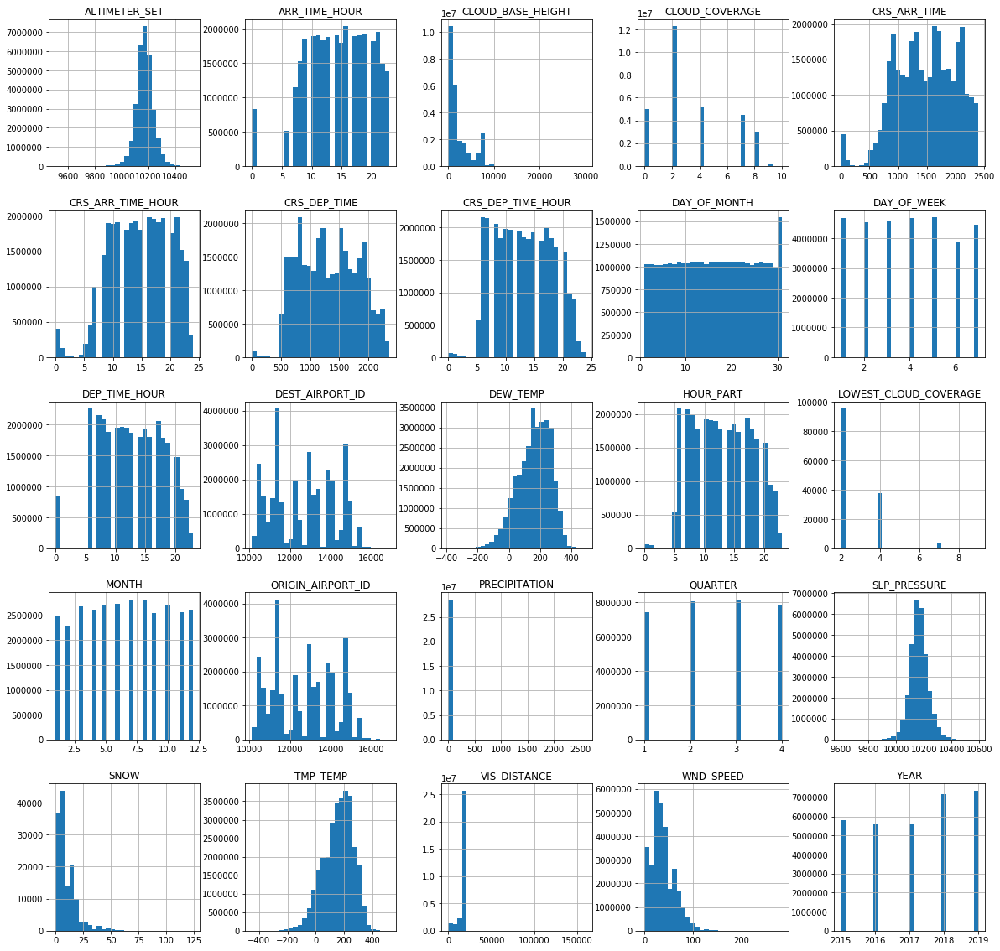

In [106]:
numericCols = [feature for (feature, dataType) in airlines_weather.dtypes if ((dataType == "int") & (feature != "DEP_DEL15"))]

feature_hist_df = airlines_weather.select(numericCols).toPandas()
feature_hist_df.hist(figsize=(20, 20), bins=30)
plt.show()

In [107]:
airlines_weather.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: date (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: string (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- CRS_DEP_TIME_HOUR: integer (nullable = true)
-- DEP_TIME_HOUR: integer (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- CRS_ARR_TIME_HOUR: integer (nullable = true)
-- ARR_TIME_HOUR: integer (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: string (nullable = true)
-- DEP_DEL15: string (nullable = true)
-- ARR_DEL15: string (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_LATITUDE: double (nullable = true)
-- ORIGIN_LONGITUDE: double (nullable = true)
-- weather_station: string (nullable = true)
-- DESTINATION_LATITUDE: double (nullable = true)
-- DESTINATION_LONGITUDE: double (nullable = true)
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- DATE_PART: date (nullable = true)
-- HOUR_PART: integer (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- QUALITY_CONTROL: string (nullable = true)
-- WND_SPEED: integer (nullable = true)
-- CIG_CAVOC: string (nullable = true)
-- VIS_DISTANCE: integer (nullable = true)
-- TMP_TEMP: integer (nullable = true)
-- DEW_TEMP: integer (nullable = true)
-- SLP_PRESSURE: integer (nullable = true)
-- PRECIPITATION: integer (nullable = true)
-- SNOW: integer (nullable = true)
-- WEATHER_OBSERVATION: string (nullable = true)
-- CLOUD_COVERAGE: integer (nullable = true)
-- CLOUD_BASE_HEIGHT: integer (nullable = true)
-- LOWEST_CLOUD_COVERAGE: integer (nullable = true)
-- GROUND_SURFACE: string (nullable = true)
-- ALTIMETER_SET: integer (nullable = true)

In [108]:

target_features = [
  "CRS_DEP_TIME_HOUR",
  "DEP_DELAY_NEW",
  "CRS_ARR_TIME_HOUR",
  "ARR_DELAY_NEW",
  "DISTANCE",
  "WND_SPEED",
  "VIS_DISTANCE",
  "TMP_TEMP",
  "DEW_TEMP",
  "SLP_PRESSURE",
  "PRECIPITATION",
  "SNOW",
  "CLOUD_COVERAGE",
  "CLOUD_BASE_HEIGHT",
  "LOWEST_CLOUD_COVERAGE",
  "ALTIMETER_SET"  
]

corr = airlines_weather.select(target_features).toPandas().corr()

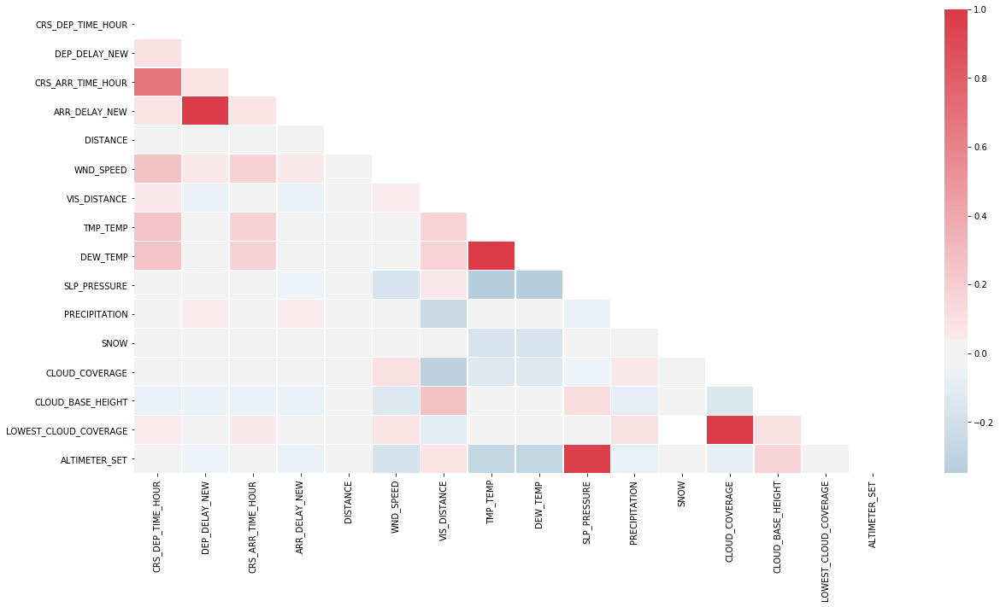

In [109]:
# Plotting the correlation matrix
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(240, 10, as_cmap=True)
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)

##### Arrival and departure delay

Percent delay by Carrier
* Not all carriers are created equally
* Arrival delays and departure delays track each other closely - strong correlation
* % departure delays tend to be higher than arrival delays when grouped by most other features, but some carriers tend to have higher arrival delays
  - It makes sense for departure delays to be higher since pilots have more room to catch up to the schedule en-route
  - We wonder if the exception of come carriers are due to the specific regions that they serve

In [112]:
%sql 
-- Plotting the percent delay by carrier
SELECT
  OP_UNIQUE_CARRIER AS Carrier,
  AVG(DEP_DEL15) AS PercentDepartureDelay,
  AVG(ARR_DEL15) AS PercentArrivalDelay
FROM
  airlines_weather
GROUP BY
  OP_UNIQUE_CARRIER
ORDER BY 
  2 DESC

Carrier,PercentDepartureDelay,PercentArrivalDelay
B6,0.2503909412768568,0.2517021685194317
F9,0.24552262512003564,0.2529625579412618
VX,0.21259366579306782,0.23473201432209959
WN,0.21117300502747977,0.18920008560021634
G4,0.20471508454584958,0.21670096889877896
NK,0.20276618020224144,0.21451965757366045
OH,0.19691347765766806,0.2045331377536274
UA,0.1909435670400159,0.19224840328341236
YV,0.18469296352505998,0.20822136515318176
MQ,0.18308326504091363,0.20913780679596697


Percent delay of day of week
* Mid-week and Saturdays tend to have least amount of delays; Mondays tend to be the worst.

In [114]:
%sql 
-- Plotting the percent delay by day of week
SELECT
  DAY_OF_WEEK AS DOW,
  AVG(DEP_DEL15) AS PercentDepartureDelay,
  AVG(ARR_DEL15) AS PercentArrivalDelay
FROM
  airlines_weather
GROUP BY
  1
ORDER BY 
  1

DOW,PercentDepartureDelay,PercentArrivalDelay
1,0.19096136631838434,0.1955225911406405
2,0.1704820766486809,0.1762263012572585
3,0.1704106549825334,0.1777645923819744
4,0.1944729857832064,0.202731323057558
5,0.1973544269717844,0.20270864270864272
6,0.1625457518884822,0.1610642439974043
7,0.18086484218744567,0.18298180490121543


Percent delay by month 
* When we have the entire airlines dataset, it'd interesting to see if seasonality has any influence on delays

In [116]:
%sql 
SELECT
-- Plotting the percent delay by month
  MONTH AS Month,
  AVG(DEP_DEL15) AS PercentDepartureDelay,
  AVG(ARR_DEL15) AS PercentArrivalDelay
FROM
  airlines_weather
GROUP BY
  1
ORDER BY 
  1

Month,PercentDepartureDelay,PercentArrivalDelay
1,0.18441745922883462,0.19172918050699653
2,0.18545946499912844,0.1952378721069298
3,0.17450045248295598,0.17782153770959971
4,0.17100712891207268,0.17615671827169646
5,0.18593579978237215,0.1894236127345681
6,0.2238150466320331,0.22801497236979243
7,0.21715729443347584,0.2188552451567477
8,0.20408425764351282,0.20880351657648247
9,0.13675886694390768,0.142674605009936
10,0.14457972554201262,0.15021110726148143


Percent delay by actual departure/arrival time

In [118]:
%sql 
SELECT
-- Plotting the percent delay by day of the month
  DAY_OF_MONTH AS Day_Of_Month,
  AVG(DEP_DEL15) AS PercentDepartureDelay,
  AVG(ARR_DEL15) AS PercentArrivalDelay
FROM
  airlines_weather
GROUP BY
  1
ORDER BY 
  1

Day_Of_Month,PercentDepartureDelay,PercentArrivalDelay
1,0.1879124313892359,0.19202424778226848
2,0.19003950145762918,0.19665207836873996
3,0.17892785702396558,0.18373394602931054
4,0.1672223616791932,0.17176237128674376
5,0.17262190302138097,0.17829244349589904
6,0.17497507765936318,0.18135273459228146
7,0.17691759492329426,0.18463566527518807
8,0.18549075746033086,0.18957157275472886
9,0.19004247387043144,0.1953002767791318
10,0.1804795404267328,0.18587238450863744


In [119]:
%sql 
WITH departure AS (
  SELECT
    DEP_TIME_BLK AS TimeBlock,
    AVG(DEP_DEL15) AS PercentDepartureDelay
  FROM
    airlines_weather
  GROUP BY
    1
  ORDER BY 
    1
  ), arrival AS (
  SELECT
  ARR_TIME_BLK AS TimeBlock,
  AVG(ARR_DEL15) AS PercentArrivalDelay
  FROM
    airlines_weather
  GROUP BY
    1
  ORDER BY 
    1
  )
SELECT
  a.TimeBlock,
  a.PercentArrivalDelay,
  d.PercentDepartureDelay
FROM
  arrival a JOIN departure d
  ON a.TimeBlock = d.TimeBlock
ORDER BY 
  1

TimeBlock,PercentArrivalDelay,PercentDepartureDelay
0001-0559,0.23151920073736945,0.07729650618567505
0600-0659,0.10991760459935601,0.0655985998749257
0700-0759,0.08909636685749733,0.08656833797521074
0800-0859,0.10339207005340789,0.10722081517299854
0900-0959,0.1126992237876244,0.12875381495243624
1000-1059,0.12528294728855355,0.14668130677872745
1100-1159,0.13549333246676193,0.16073261628913035
1200-1259,0.14457111197840616,0.1754904403445642
1300-1359,0.15535001307552881,0.1906319733657925
1400-1459,0.16863353046429075,0.21134117378662443


Percent delay by scheduled departure/arrival time

In [121]:
%sql 
WITH departure AS (
  SELECT
    CRS_DEP_TIME_HOUR AS Hour,
    AVG(DEP_DEL15) AS PercentDepartureDelay
  FROM
    airlines_weather
  GROUP BY
    1
  ORDER BY 
    1
  ), arrival AS (
  SELECT
  CRS_ARR_TIME_HOUR AS Hour,
  AVG(ARR_DEL15) AS PercentArrivalDelay
  FROM
    airlines_weather
  GROUP BY
    1
  ORDER BY 
    1
  )
SELECT
  a.Hour,
  a.PercentArrivalDelay,
  d.PercentDepartureDelay
FROM
  arrival a JOIN departure d
  ON a.Hour = d.Hour
ORDER BY 
  1

Hour,PercentArrivalDelay,PercentDepartureDelay
0,0.25685805643675874,0.17139975305636226
1,0.2863083240014931,0.17130616509926855
2,0.24646690864159396,0.2141541038525963
3,0.2765451664025357,0.2588763433546456
4,0.1974946431514752,0.24526343109265508
5,0.1635401860789612,0.05865235329571929
6,0.11857522571008061,0.06417013857492947
7,0.08846322883827376,0.083665405687634
8,0.10041166076268201,0.10454973868513684
9,0.11047424317241655,0.1266451234643651


Percent delay by distance

In [123]:
%sql
SELECT
  DISTANCE,
  AVG(DEP_DELAY_NEW) AS PercentDelay
FROM
  airlines_weather
GROUP BY
  1
ORDER BY 
  1

DISTANCE,PercentDelay
28.0,7.0
30.0,4.0
31.0,8.058608058608058
41.0,8.03366583541147
45.0,22.858369098712448
47.0,21.0
49.0,15.324324324324325
54.0,23.0
55.0,15.88888888888889
62.0,0.0


Percent delay by "ORIGIN" airport

In [125]:
%sql 
SELECT
  ORIGIN AS Carrier,
  AVG(DEP_DEL15) AS PercentDepartureDelay
FROM
  airlines_weather
GROUP BY
  ORIGIN
ORDER BY 
  2 DESC

Carrier,PercentDepartureDelay
YNG,1.0
ILG,0.3894736842105263
OWB,0.35968379446640314
OGD,0.3318777292576419
OTH,0.3316532258064516
HGR,0.3217665615141956
ADK,0.32043650793650796
SCK,0.3094297007340486
MVY,0.3004067402672865
MMH,0.29232505643340856


In [126]:
%sql 
SELECT
  ORIGIN AS Carrier,
  AVG(ARR_DEL15) AS PercentArrivalDelay
FROM
  airlines_weather
GROUP BY
  ORIGIN
ORDER BY 
  2 DESC

Carrier,PercentArrivalDelay
EFD,1.0
YNG,0.5
ILG,0.3894736842105263
MMH,0.33521444695259595
OTH,0.33501344086021506
OWB,0.3201581027667984
OGD,0.314410480349345
ADK,0.3125
SCK,0.30886504799548276
HGR,0.3028391167192429


### Feature engineering and selection

##### Imputation

The distribution of each feature was reviewed prior to making a decision on the imputation. For normal distributions, mean was chosen for imputation and for slightly skewed distribution, median was chosen for imputation.

In [129]:
# Creating seperate lists that include column names to calculate mean and median
cols_mean = ["ALTIMETER_SET", "DEW_TEMP", "SLP_PRESSURE", "TMP_TEMP"]
cols_median = ["CLOUD_BASE_HEIGHT", "CLOUD_COVERAGE", "PRECIPITATION", "SNOW", "VIS_DISTANCE", "WND_SPEED"]

# replacing null values with mean value
for c in cols_mean:
  c_mean = airlines_weather.agg({c: 'mean'}).collect()[0][0]
  airlines_weather = airlines_weather.na.fill({c: c_mean})

# replacing null values with median value
for c in cols_median:
  c_median = airlines_weather.approxQuantile(c, [0.5],0.1)[0]
  airlines_weather = airlines_weather.na.fill({c: c_median})

In [130]:
# displaying the number of null values
null_check = ["ALTIMETER_SET", "DEW_TEMP", "SLP_PRESSURE", "TMP_TEMP", "CLOUD_BASE_HEIGHT", "CLOUD_COVERAGE", "PRECIPITATION", "SNOW", "VIS_DISTANCE", "WND_SPEED"] 
display(airlines_weather.select([f.count(f.when(f.isnan(c) | f.col(c).isNull(), c)).alias(c) for c in null_check]))

ALTIMETER_SET,DEW_TEMP,SLP_PRESSURE,TMP_TEMP,CLOUD_BASE_HEIGHT,CLOUD_COVERAGE,PRECIPITATION,SNOW,VIS_DISTANCE,WND_SPEED
0,0,0,0,0,0,0,0,0,0


##### Feature Selection

In [132]:
drop_features = [
 'FL_DATE',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'CRS_DEP_TIME',
 'DEP_TIME_HOUR',
 'DEP_DELAY_NEW',
 'DEP_TIME_BLK',
 'CRS_ARR_TIME',
 'ARR_TIME_HOUR',
 'ARR_DELAY_NEW',
 'ARR_TIME_BLK',
 'DISTANCE_GROUP',
 'ARR_DEL15',
 'ORIGIN_AIRPORT_ID',
 'DEST_AIRPORT_ID',
 'CRS_DEP_TIMESTAMP',
 'CRS_ARR_TIMESTAMP',
 'ORIGIN_LATITUDE',
 'ORIGIN_LONGITUDE',
 'weather_station',
 'DESTINATION_LATITUDE',
 'DESTINATION_LONGITUDE',
 'TWO_HOUR',
 'AL_ThisTimeStamp',
 'STATION',
 'DATE',
 'LATITUDE',
 'LONGITUDE',
 'NAME',
 'REPORT_TYPE',
 'CALL_SIGN',
 'GROUND_SURFACE',
 'WEATHER_OBSERVATION',
 'CIG_CAVOC',
 'WND',
 'DATE_PART',
 'HOUR_PART',
 'MINUTE_PART',
 'AL_JOIN_DATE',
 'AL_JOIN_HOUR',
 'AL_JOIN_MINUTE',
 'AL_JOIN_TIMESTAMP',
 'ThisTimeStamp',
 'NextTimeStamp',
 'OP_CARRIER_FL_NUM',
 'TAIL_NUM']

# resulting features given the drop list
features_model = list(set(airlines_weather.columns).difference(drop_features))
data_model = airlines_weather.select(features_model)
data_model.createOrReplaceTempView("data_model")
features_model

Out[513]: ['DAY_OF_WEEK',
 'ORIGIN',
 'PRECIPITATION',
 'CRS_ARR_TIME_HOUR',
 'SNOW',
 'DISTANCE',
 'MONTH',
 'CLOUD_BASE_HEIGHT',
 'ALTIMETER_SET',
 'PR_ARR_DEL15',
 'OP_CARRIER_FL_NUM',
 'QUARTER',
 'YEAR',
 'DEP_DEL15',
 'DEST',
 'SLP_PRESSURE',
 'TMP_TEMP',
 'DEW_TEMP',
 'CRS_DEP_TIME_HOUR',
 'OP_UNIQUE_CARRIER',
 'TAIL_NUM',
 'VIS_DISTANCE',
 'DAY_OF_MONTH',
 'CLOUD_COVERAGE',
 'WND_SPEED']

##### Drop Outcome Variables with NULL Values

As we only have approximately 3700 records with null labels, we decided to drop those records at this stage

In [134]:
data_model = spark.sql(
"""
SELECT
  *
FROM
  data_model
WHERE
  DEP_DEL15 IS NOT NULL
"""
)

In [135]:
categoricals = [
 'YEAR',
 'DEP_DEL15',
 'DAY_OF_WEEK',
 'ORIGIN',
 'DEST',
 'CRS_ARR_TIME_HOUR',
 'CRS_DEP_TIME_HOUR',
 'OP_UNIQUE_CARRIER',
 'MONTH',
 'TAIL_NUM',
 'DAY_OF_MONTH',
 'OP_CARRIER_FL_NUM',
 'QUARTER',
 'PR_ARR_DEL15']

Y = 'DEP_DEL15'

numerics = list(set(features_model).difference(categoricals))
numerics

Out[521]: ['CLOUD_BASE_HEIGHT',
 'ALTIMETER_SET',
 'PRECIPITATION',
 'SNOW',
 'SLP_PRESSURE',
 'TMP_TEMP',
 'DEW_TEMP',
 'DISTANCE',
 'CLOUD_COVERAGE',
 'VIS_DISTANCE',
 'WND_SPEED']

In [136]:
data_model = data_model.select([f.col(feature).cast("int") for feature in numerics] + [f.col(feature).cast("string") for feature in categoricals])

### Splitting The Data Into Train, Validation & Test

To maintain datapoints with similar seasonality, time and weather conditions, 2019 data was reserved for testing. On the balance data, 80/20 split was applied to obtain the train and validation data.

In [138]:
data_model.createOrReplaceTempView('data_model')

In [139]:
# Caching the data_model
#data_model.cache()

# Filtering out 2019 data for training and validation dataset
preTrainRDD = spark.sql(
"""
SELECT
  *
FROM
  data_model
WHERE
  YEAR != "2019"
"""
)

In [140]:
# Verifying that 2019 data is not in dataset
display(preTrainRDD.select("YEAR").distinct())

YEAR
2016
2017
2018
2015


In [141]:
# Keeping 2019 data aside for testing. 
testRDD = spark.sql(
"""
SELECT
  *
FROM
  data_model
WHERE
  YEAR == "2019"
""")

In [142]:
# Verifying that only 2019 data is in the test dataset
display(testRDD.select("YEAR").distinct())

YEAR
2019


In [143]:
# Splitting the 2015-2018 data into train and validation
trainRDD, validationRDD = preTrainRDD.randomSplit([0.8,0.2], seed = 42)

# Checking the number of records for each dataset
print(f"... train dataset has {trainRDD.count()} records for evaluation")
print(f"... validation dataset has {validationRDD.count()} records for evaluation")
print(f"... test dataset has {testRDD.count()} records for evaluation")

... train dataset has 19125295 records for evaluation
... validation dataset has 4781271 records for evaluation
... test dataset has 7268232 records for evaluation

In [144]:
# Displaying trainRDD
display(trainRDD)

CLOUD_BASE_HEIGHT,ALTIMETER_SET,PRECIPITATION,SNOW,SLP_PRESSURE,TMP_TEMP,DEW_TEMP,DISTANCE,CLOUD_COVERAGE,VIS_DISTANCE,WND_SPEED,YEAR,DEP_DEL15,DAY_OF_WEEK,ORIGIN,DEST,CRS_ARR_TIME_HOUR,CRS_DEP_TIME_HOUR,OP_UNIQUE_CARRIER,MONTH,TAIL_NUM,DAY_OF_MONTH,OP_CARRIER_FL_NUM,QUARTER,PR_ARR_DEL15
0,10007,0,5,10005,83,83,547,4,805,26,2017,0.0,3,DCA,ATL,8,6,WN,1,N7718B,4,WN_3420,1,0.0
0,10007,0,5,10005,83,83,577,4,805,26,2017,0.0,3,BWI,ATL,8,6,WN,1,N7743B,4,WN_529,1,0.0
0,10007,3,5,10005,156,122,296,4,8047,108,2016,0.0,3,SJC,BUR,22,21,WN,2,N414WN,17,WN_1478,1,0.0
0,10007,3,5,10005,156,122,342,4,8047,108,2016,1.0,3,SJC,SNA,22,21,WN,2,N7746C,17,WN_379,1,1.0
0,10010,0,5,9944,256,-122,583,4,1609,144,2017,1.0,5,ELP,LAS,17,16,WN,3,N651SW,31,WN_4795,1,1.0
0,10010,0,5,10009,156,117,308,4,11265,93,2016,1.0,3,SJC,LAX,21,20,WN,2,N944WN,17,WN_2339,1,1.0
0,10030,81,5,10030,111,94,386,4,4828,36,2016,1.0,2,SJC,LAS,9,8,DL,1,N974AT,5,DL_749,1,0.0
0,10041,0,5,10036,117,117,249,4,16093,21,2018,0.0,7,CRW,DCA,10,9,OH,12,N260JS,2,OH_5153,4,0.0
0,10044,5,5,10044,100,83,697,4,14484,77,2016,0.0,3,SJC,SEA,12,9,AS,1,N562AS,6,AS_327,1,0.0
0,10051,0,5,10051,50,44,991,4,402,36,2016,0.0,5,PDX,DEN,12,8,WN,3,N463WN,11,WN_2583,1,0.0


In [145]:
# Displaying validationRDD
display(validationRDD)

CLOUD_BASE_HEIGHT,ALTIMETER_SET,PRECIPITATION,SNOW,SLP_PRESSURE,TMP_TEMP,DEW_TEMP,DISTANCE,CLOUD_COVERAGE,VIS_DISTANCE,WND_SPEED,YEAR,DEP_DEL15,DAY_OF_WEEK,ORIGIN,DEST,CRS_ARR_TIME_HOUR,CRS_DEP_TIME_HOUR,OP_UNIQUE_CARRIER,MONTH,TAIL_NUM,DAY_OF_MONTH,OP_CARRIER_FL_NUM,QUARTER,PR_ARR_DEL15
0,10007,0,5,10005,83,83,919,4,805,26,2017,0.0,3,BWI,RSW,9,6,WN,1,N467WN,4,WN_3041,1,0.0
0,10010,0,5,9944,256,-122,677,4,1609,144,2017,1.0,5,ELP,HOU,19,16,WN,3,N646SW,31,WN_1646,1,1.0
0,10030,81,5,10030,111,94,308,4,4828,36,2016,1.0,2,SJC,LAX,10,9,DL,1,N342NB,5,DL_928,1,1.0
0,10051,3,5,10049,117,100,308,4,9656,21,2016,1.0,2,SJC,LAX,14,13,WN,1,N748SW,5,WN_367,1,1.0
0,10058,18,5,10057,122,100,333,4,4828,57,2016,0.0,2,SJC,ONT,16,14,WN,1,N215WN,5,WN_807,1,0.0
0,10068,8,5,10066,161,139,569,4,9656,51,2016,0.0,6,SJC,PDX,20,18,WN,3,N643SW,5,WN_3351,1,1.0
0,10075,0,5,10165,310,190,989,9,3219,154,2018,1.0,2,SWF,MCO,21,18,B6,5,N306JB,15,B6_445,2,1.0
0,10085,0,5,10082,200,189,337,4,9656,0,2017,0.0,2,LAX,SFO,8,7,UA,8,N77518,29,UA_1294,3,0.0
0,10085,0,5,10085,139,78,308,4,16093,77,2016,1.0,5,SJC,LAX,16,15,WN,3,N265WN,11,WN_2298,1,1.0
0,10085,33,5,10083,206,189,1416,4,805,15,2017,1.0,3,IAH,LGA,21,16,UA,3,N37253,29,UA_1284,1,1.0


In [146]:
# Displaying testRDD
display(testRDD)

CLOUD_BASE_HEIGHT,ALTIMETER_SET,PRECIPITATION,SNOW,SLP_PRESSURE,TMP_TEMP,DEW_TEMP,DISTANCE,CLOUD_COVERAGE,VIS_DISTANCE,WND_SPEED,YEAR,DEP_DEL15,DAY_OF_WEEK,ORIGIN,DEST,CRS_ARR_TIME_HOUR,CRS_DEP_TIME_HOUR,OP_UNIQUE_CARRIER,MONTH,TAIL_NUM,DAY_OF_MONTH,OP_CARRIER_FL_NUM,QUARTER,PR_ARR_DEL15
1219,10159,0,5,10158,228,128,508,0,16093,46,2019,0.0,2,PHF,ATL,14,12,9E,5,N923XJ,21,9E_5002,2,0.0
30,10230,0,5,10165,159,158,176,4,16093,0,2019,0.0,1,LWB,IAD,11,10,OO,7,N925EV,29,OO_5103,3,0.0
183,10322,3,5,10321,17,0,508,8,4828,77,2019,0.0,3,PHF,ATL,13,11,9E,2,N676CA,20,9E_5087,1,0.0
1219,10129,0,5,10128,244,211,508,0,16093,41,2019,0.0,2,PHF,ATL,8,6,DL,8,N910DE,13,DL_2066,3,0.0
1219,10156,0,5,10156,106,-44,282,0,16093,62,2019,0.0,4,PHF,CLT,17,15,OH,12,N257PS,5,OH_5176,4,0.0
884,10102,0,5,10101,150,106,508,7,16093,82,2019,0.0,3,PHF,ATL,19,17,DL,11,N924AT,27,DL_510,4,0.0
1219,10027,0,5,10165,50,-30,489,4,16093,62,2019,0.0,3,LWB,ORD,19,17,OO,12,N925EV,4,OO_5081,4,0.0
1219,10149,0,5,10147,294,222,282,0,16093,46,2019,0.0,4,PHF,CLT,17,15,OH,10,N257PS,3,OH_5176,4,0.0
244,10166,0,5,10165,159,154,176,4,8047,0,2019,0.0,2,LWB,IAD,11,10,OO,7,N978SW,23,OO_5103,3,0.0
1219,10149,0,5,10148,239,94,508,0,16093,26,2019,0.0,6,PHF,ATL,18,16,9E,10,N299PQ,12,9E_3424,4,0.0


##### Check point - trainRDD, validationRDD, testRDD

In [148]:
# COMMENTING OUT TO AVOID REPLACING THE PARQUET FILE

# write to parquet

#trainRDD
#dbutils.fs.rm(TEAM_PATH + "trainRDD.parquet", recurse=True)
#trainRDD.repartition(10).write.parquet(TEAM_PATH + "trainRDD.parquet")

#validationRDD
#dbutils.fs.rm(TEAM_PATH + "validationRDD.parquet", recurse=True)
#validationRDD.repartition(10).write.parquet(TEAM_PATH + "validationRDD.parquet")

#testRDD
#dbutils.fs.rm(TEAM_PATH + "testRDD.parquet", recurse=True)
#testRDD.repartition(10).write.parquet(TEAM_PATH + "testRDD.parquet")

In [149]:
# Read from parquet
trainRDD = spark.read.option("header", "true").parquet(TEAM_PATH+"trainRDD.parquet")
validationRDD = spark.read.option("header", "true").parquet(TEAM_PATH+"validationRDD.parquet")
testRDD = spark.read.option("header", "true").parquet(TEAM_PATH+"testRDD.parquet")


# Checking the number of records for each dataset
print(f"... train dataset has {trainRDD.count()} records for evaluation")
print(f"... validation dataset has {validationRDD.count()} records for evaluation")
print(f"... test dataset has {testRDD.count()} records for evaluation")

... train dataset has 19124872 records for evaluation
... validation dataset has 4781329 records for evaluation
... test dataset has 7268232 records for evaluation

In [150]:
trainRDD.printSchema()

root
-- CLOUD_BASE_HEIGHT: integer (nullable = true)
-- ALTIMETER_SET: integer (nullable = true)
-- PRECIPITATION: integer (nullable = true)
-- SNOW: integer (nullable = true)
-- SLP_PRESSURE: integer (nullable = true)
-- TMP_TEMP: integer (nullable = true)
-- DEW_TEMP: integer (nullable = true)
-- DISTANCE: integer (nullable = true)
-- CLOUD_COVERAGE: integer (nullable = true)
-- VIS_DISTANCE: integer (nullable = true)
-- WND_SPEED: integer (nullable = true)
-- YEAR: string (nullable = true)
-- DEP_DEL15: string (nullable = true)
-- DAY_OF_WEEK: string (nullable = true)
-- ORIGIN: string (nullable = true)
-- DEST: string (nullable = true)
-- CRS_ARR_TIME_HOUR: string (nullable = true)
-- CRS_DEP_TIME_HOUR: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- MONTH: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- DAY_OF_MONTH: string (nullable = true)
-- OP_CARRIER_FL_NUM: string (nullable = true)
-- QUARTER: string (nullable = true)
-- PR_ARR_DEL15: string (nullable = true)

### Algorithm Theory

#### Logistic regression
**- Expectation:** We face a binary classification task - Delay and Ontime. Logistic regression algorithm which takes in a features and calculates the outcome (dependent variable) based on probability of each class is intutive and easy to interpret. Logistic regression also works well with categorical variables. In predicting flight delay task, we expect logistic regression to take in all numeric and categorical variables - timeline, airline, airport and weather related conditions and then inform us if the flight will be on-time (0) or delayed (1). 

**- Trade-Off** With training a logistic regression model, you will have a tradeoff between precision and recall. The choice between the two will be dictated by the business need and the cost. In the flight delay business case, the airline would like to minimize false positives, wherein they inform a passenger that a flight will be delayed when the flight will be on time. This might result in the airline compensating the customer incorrectly for a delayed flight and loosing goodwill. In terms of manchine learning at scale, Logistic Regression can take in many categorical features which needs to be encoded into a vector. However, numberous categorical variables especially ones with many distinct categories increases the training time significantly.

**- The algorithm:** Logistic Regression is a classification algorithm used to assign observation to discrete set of classes using probability. The algorithm takes in real input and assigns values between 0 and 1 using the sigmoid cost function which is an 'S' shaped curve.

Logistic Regression Hypothesis Expectation is: $$0 <= h_{\theta}(x) <= 1$$

$$z = \beta_0 +\beta_1X_1 +\beta_1X_2 + ...$$

$$h_{\theta}(x) = \frac{1}{(1 + e^{-z})}$$

In the above funton X is the input to the function and e is the base of the natural log. With a chosen threshold of 0.5, any prediction returned with a value of greater than 0.5 will be classified as a "Delay". The aim of this threshold is to maximise the likelihood that a given datapoint gets classified correctly, which is the Maximum Liklihood Estimation.

- [Link to Notebook - Logistic Regression](<https://dbc-9bfca75b-725c.cloud.databricks.com/?o=52497824689954#notebook/2542098129699374/command/2542098129699390>)

#### Decision tree & Random Forest
- **Expectation**: Decision tree classifiers would deliver a clear decision making framework that's intuitive for us to understand. I expect the classifier to work fairly well since certain factors such as weather condition, carriers, and seasonality trends clearly contribute to airline's on-time performance. It will be relatively fast to train. It would simplify training data pre-processing stage as well since no one-hot-encoding or scaling is needed for tree algorithms. On the other hand, random forest classifiers would deliver better prediciton results (lower bias and variance) since they ensemble a series of decision classifiers together.  
- **Trade-offs**: Although decision trees are relatively fast to train, single pass decision trees can be biased. There is a possibility of overfitting a tree. In addition, information gain in a decision tree with categorical variables gives a biased response for attributes with greater number of categories. On the other hand, even though random forest classifiers deliver better prediciton results, they take a lot longer to train.
- **The algorithm**: The decision algorithm first places the best attribute of the dataset at the root of the tree. Then, it split the training set into subsets by looking for features with the highest amount of information gain or lowest entropy. The algorithm will repeat the steps until it reaches a pre-set maximum depth/information gain criteria or when leaf nodes are present in all branches of the tree. Similarly, random forest classifiers consist of a series of decision trees. It uses bagging and feature randomness when building each individual tree to create an uncorrelated forest of trees. Entropy is defined as $$H(x) = -\sum_{i=1}^n p(x i) \log 2 p(x i)$$
- [Link to notebook (decision tree & random forest)](https://dbc-9bfca75b-725c.cloud.databricks.com/?o=52497824689954#notebook/2542098129680769/command/2542098129696451)

#### Gradient Boosting 

1) expectation
- Compared to the random forest, GBT is better learner since it builds trees one at a time, where each new tree helps to correct errors made by previously trained tree. 

2) trade-offs
- GBT training generally takes longer because of the fact that trees are built sequentially. Additionally, GBT is prone to overfitting, however there are strategies to overcome by changing the depth of the tree. Generally the parameter is kept on the lower side to allow for better generalization.

3) algorithm
- Gradient boosting iteratively trains a sequence of decision trees. On each iteration, the algorithm uses the current ensemble to predict the label of each training instance and then compares the prediction with the true label. The dataset is re-labeled to put more emphasis on training instances with poor predictions. Thus, in the next iteration, the decision tree will help correct for previous mistakes. The specific mechanism for re-labeling instances is defined by a loss function (discussed below). With each iteration, GBTs further reduce this loss function on the training data.

- For classification, here's the loss function provided:

$$2\sum_{i=1}^{n}log(1+exp(-2y_if(x_i)))$$

Where

N = number of instances. yi = label of instance i. xi = features of instance i. f(xi) = model’s predicted label for instance i

4) Link to the model notebook
- https://dbc-9bfca75b-725c.cloud.databricks.com/?o=52497824689954#notebook/2542098129682584/command/2542098129691781

5) Cite
- https://spark.apache.org/docs/latest/mllib-ensembles.html#gradient-boosted-trees-gbts

### Implementation & Design Choices



####ML Pipeline

**1) String Indexer:**:
Encoded the categorical columns of string labels/categories to a columns of indices. The ordering of the indices is done on the basis of popularity and the range is [0, numOfLabels).

**2) One Hot Encoder:**

***Only performed for logistic regression***

One hot encoder maps the label indices to a binary vector representation with at the most a single one-value. These methods are generally used when we need to use categorical features but the algorithm expects continuous features. The spark one hot encoder takes the indexed label/category from the string indexer and then encodes it into a sparse vector.
The first component which is a 0 indicates that it is a sparse vector. The second component talks about the size of the vector. The third component talks about the indices where the vector is populated while the fourth component talks about what values these are. This truncates the vector and is really efficient when you have really large vector representations.

**3) Vector Assembler:**
Vector assembler’s job is to combine the raw features and features generated from various transforms into a single feature vector. It accepts boolean, numerical and vector type inputs.

**4) Normalizing the features:**

StandardScaler added to normalize the features to a distribution with a mean value 0 and standard deviation of 1.

**5) Handling Class Imbalance:**

***Only performed for logistic regression***

There is an imbalance between the proportion of ontime and delayed flights in the airline dataset. For this reason, while training the algorithm should treat delays (DEP_DEL15 ==1) with a higher weight. For this purpose, a BalancingRation was added to the training data where:

$$BalancingRatio = \frac{numNegatives}{datasetSize}$$

Against every Outcome == 1, a BalancingRatio “classWeights” was added, and against every Outcome == 0, a (1-BalancingRatio) was added to column “classWeights”. This way, a higher weightage was assigned to the minority class.

**6) Algorithm:**
Classification model with parameters was created. Each algorithm choice is discussed above and a link to the notebook has been provided.

**7) Hyperparameter Tuning:**

Tuned hyperparameters using different regularizers in ParameterGrid and CrossValidators

####[Link for End To End pipeline](https://dbc-9bfca75b-725c.cloud.databricks.com/?o=52497824689954#notebook/887545360132133/command/887545360132538)

### Principal Component Analysis

- After model exploration, we tried to implement PCA on our model to improve performance, but found it could only apply to numeric features. Since our dataset has many categorical features, we decided not to include it in our model.

In [158]:
from pyspark.ml.feature import PCA
from pyspark.ml.feature import StringIndexer, VectorAssembler, OneHotEncoder
from pyspark.ml.feature import StandardScaler, Imputer

numerics = ['CLOUD_BASE_HEIGHT',
 'ALTIMETER_SET',
 'PRECIPITATION',
 'SNOW',
 'SLP_PRESSURE',
 'TMP_TEMP',
 'DEW_TEMP',
 'DISTANCE',
 'CLOUD_COVERAGE',
 'VIS_DISTANCE',
 'WND_SPEED']

vector_assembler = VectorAssembler(inputCols = numerics,
outputCol = 'features')
vector_trainRDD = vector_assembler.transform(trainRDD).select("features")

standardizer = StandardScaler(withMean=True, withStd=True,
inputCol='features', outputCol='std_features').fit(vector_trainRDD)

scaled_trainRDD = standardizer.transform(vector_trainRDD)

pca = PCA(k=11, inputCol='std_features', outputCol="pca_features").fit(scaled_trainRDD)

pca_trainRDD = pca.transform(scaled_trainRDD)
explained_var = pca.explainedVariance.toArray()

In [159]:
list_var = list(explained_var)
plot_var=[sum(plot_var[0:x+1]) for x in range(0,len(plot_var))]
plot_var

Out[24]: [0.2379234735752535,
 0.3922204426053463,
 0.507214417343879,
 0.6028636465417783,
 0.6934820725468049,
 0.7835432334047876,
 0.8677616567250146,
 0.9392348697495382,
 0.9821441199475474,
 0.9979073453923262,
 0.9999999999999999]

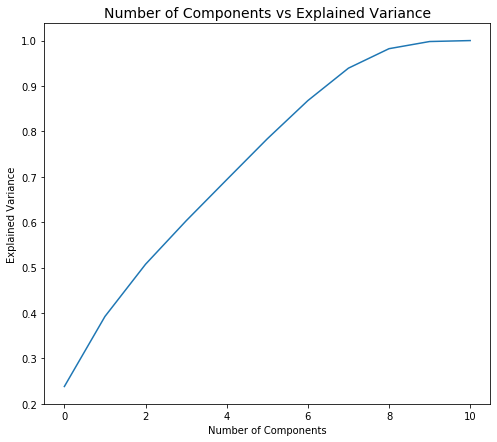

In [160]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 7))
ax.plot(plot_var)
ax.set_title("Number of Components vs Explained Variance", fontsize=14)
ax.set_xlabel("Number of Components", fontsize=10)
ax.set_ylabel("Explained Variance", fontsize=10)

### Conclusion

The focus was on false positive metric, ROC is not a good evaluation metric



| Model                  | FP %  | FN %  | TP %   | TN %   | AUC  | Precision | Recall | Area Under PR | F1 Score |
|------------------------|-------|-------|--------|--------|------|-----------|--------|---------------|----------|
| Logistic Regression    |11.70% |44.10% | 55.90% | 88.30% | 0.79 | 0.52      | 0.56   | 0.55          | 0.54     |
| Decision Trees         | 4.94% |52.01% | 47.99% | 95.06% | 0.29 | 0.69      | 0.48   | 0.12          | 0.57     |
| Random Forest          | 4.58% |52.66% | 47.34% | 95.42% | 0.79 | 0.70      | 0.47   | 0.59          | 0.56     |
| Gradient Boosted Trees | 3.94% | 54.46%| 45.54% | 96.06% | 0.81 | 0.73      | 0.46   | 0.61          | 0.57     |

#### 
1) Logistic Regression:
  - Model took 5.5 hours to train (with class weights, regularization and cross validation)
  
2) Decision Trees
  - Model took less than 20 minutes (single pass) or 1 hour (with cross-validation) to train.

3) Random Forest
  - Model took 4.75 hours (with cross-validation) to train.

4) Gradient Boosting
  - Model took 5.8 hours (with cross-valitdation) to train.

#### Interpretation of the Results:

The dataset has a huge class imbalance, which was considered in the logistic regression model training by adding class weights. The AUC, which tells us how good the model is capable of classifying different labels accurately, for Logistic regression is at 0.79. However, we observed that false positve rates were also pretty high at 11.7% which is not viable for answering the business question at this point. Another review of class imbalance, additional features and hyperparameter tuning is needed to improve the results.

For other models, we were not able to due to the class imbalance present in the dataset, AUC is not a good measure. By using Gradient Boosting algorithm, we were able to reduce false positive rates from almost almost 12% down to 3.94%, giving the airlines more room for advanced planning and arrangement. Having said that, a 3.94% false positive rate means that over 3 percent of the flights can have a false alarm for delayed departure. This will cause setbacks for both the airport and passengers. Some steps that we can take to further boost the model performance is to engineer more features that directly cause flight congestion or delays, such as the aggregated departure demand in the prediction period and the average minutes of delay by carrier. 

Additionally, comparing logistic regression and tree-based algorithm, since logistic regression assumes that the data is linearly separable in space, it would show poor performance compared to tree-based models which are non-linear classifiers.

#### Cite

https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5

https://en.wikipedia.org/wiki/Sensitivity_and_specificity

####Learnings and Insights:
  
***What worked?***
- Preprocessing the key features: Data not pertinent for ML training was filtered out at each stage so time was not spent processing and transforming data that would eventually get filtered out.
- Transformation functions were grouped together to speeden up the processing time. Moreover, actions were implemented inbetween grouped transformations to avoid build up and to speeden up the processing.
- Regular checkpoints to save transformed data to avoid rerunning the preprocessing steps or if the team wanted to try a different approach
- Data not pertinent for ML training was filtered out at each stage so time was not spent processing and transforming data that would eventually get filtered out.
- During join, the number of partitions were increased to number of distinct weather stations.
- Transformation functions were grouped together to speeden up the processing time. Moreover, actions were implemented inbetween grouped transformations to avoid build up and to speeden up the processing.
- Caching the training dataset
- Increase the parallelism parameter inside the CrossValidator, which sets the number of threads to use when running parallel algorithms. The default setting is 1.
- Not using pipeline as an estimator inside CrossValidator especially when also tuning the hyperparameters.


***What did not work?***
- Numerous distinct categorical variables with low frequency, especially one-hot encoded, increased the training time significantly.
- Failure to monitor the cluster health - driver failure drove job execution to a halt
- Downsampling data greatly increased the false positives.

***Retraining the Model***
- Retraining is not required unless there is a change in the composition of features. For example, a new airport or new airline is added to the dataset.

### Course Concepts

1) Reducing Processing Time and Lazy Evaluation: The below steps reduced the amount of time it took to process an operation of training the data. Being efficient with the data being submitted and increasing the parallel processes speedend up the process it took.
- Taking only the relevant data to the next step avoids clogging the resources with unnecessary data. Also grouping and consolidating the transformations together reduced processing time. 
- During join, the number of partitions were increased to number of distinct weather stations.
- Increasing parallelism parameter for crossValidator
- Lazy evaluations occurs when transformation is passed in spark. These commands are added to DAG of computation which allows for optimizations to occur. We grouped all the transformations of airline and weather datasets together to take advantage of this optimization.
  
2) One Hot Encoding:
- We wanted to use categorical variables for logistic regression. Since no ordinal relationship exits for categorical variables, integer encoding will mislead the model. One hot encoder maps the label indices to a binary vector representation with at the most a single one-value. These methods are generally used when we need to use categorical features but the algorithm expects continuous features. The spark one hot encoder took the indexed label/category from the string indexer and then encoded it into a sparse vector. The first component which is a 0 indicates that it is a sparse vector. The second component talks about the size of the vector. The third component talks about the indices where the vector is populated while the fourth component talks about what values these are. This truncates the vector and was really efficient when you have really large vector representations.
- By one-hot encoding a categorical variable, we are inducing sparsity into the dataset which is undesirable for tree-based algorithm, so it was only applied to logistic regression algorithm.
  
3) Assumptions for Algorithms:
- Since logistic regression is a linear model, its decision boundary is linear. Therefore, it does not work as well on datasets that are not linearly separable. On the other hand, tree-based algorithms use hyper-rectangle planes to separate data points, thus would work faily well on non-linearly separable data. 

##### Cite

https://towardsdatascience.com/one-hot-encoding-is-making-your-tree-based-ensembles-worse-heres-why-d64b282b5769